In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import networkx as nx
from collections import defaultdict
import plotly.graph_objects as go
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from xgboost import XGBClassifier
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA  

In [5]:
data = pd.read_excel("/Users/zheguan/CWR_fig/Customer_Churn_Data_Large.xlsx", sheet_name= None)

In [6]:
data

{'Customer_Demographics':      CustomerID  Age Gender MaritalStatus IncomeLevel
 0             1   62      M        Single         Low
 1             2   65      M       Married         Low
 2             3   18      M        Single         Low
 3             4   21      M       Widowed         Low
 4             5   21      M      Divorced      Medium
 ..          ...  ...    ...           ...         ...
 995         996   54      F        Single         Low
 996         997   19      M       Widowed        High
 997         998   47      M       Married         Low
 998         999   23      M       Widowed        High
 999        1000   34      M       Widowed         Low
 
 [1000 rows x 5 columns],
 'Transaction_History':       CustomerID  TransactionID TransactionDate  AmountSpent ProductCategory
 0              1           7194      2022-03-27       416.50     Electronics
 1              2           7250      2022-08-08        54.96        Clothing
 2              2           96

## Customer_Demographics Sheet

In [7]:
Customer_Demographics = pd.merge(data['Customer_Demographics'], data['Churn_Status'], how="left", on="CustomerID")
#train_data, test_data = train_test_split(Customer_Demographics, test_size=0.2, random_state=42, stratify=Customer_Demographics['ChurnStatus'])

In [8]:
Customer_Demographics["Age_range"]= pd.cut(Customer_Demographics["Age"],
                               bins = [15, 20, 30, 40, 50, 60, np.inf],
                               labels = ["15-20", "20-30", "30-40", "40-50", "50-60", "60+"])

In [9]:
Age_distribution = pd.crosstab(Customer_Demographics["Age"],Customer_Demographics["ChurnStatus"],normalize="index").reset_index()

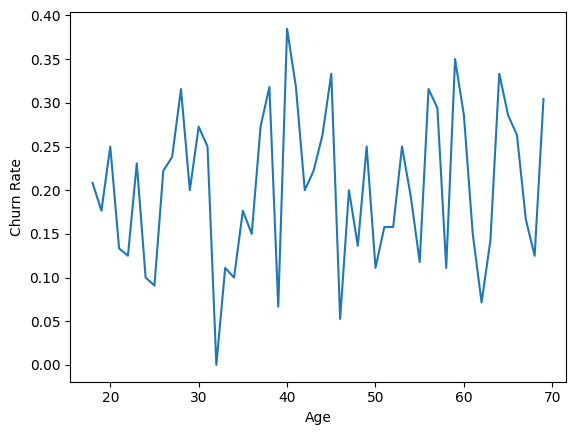

In [16]:
plt.plot(Age_distribution["Age"],Age_distribution[1])
plt.xlabel("Age")
plt.ylabel("Churn Rate")
plt.savefig("Plots/age_churn_rate.png", dpi=300, bbox_inches='tight')  
plt.show()

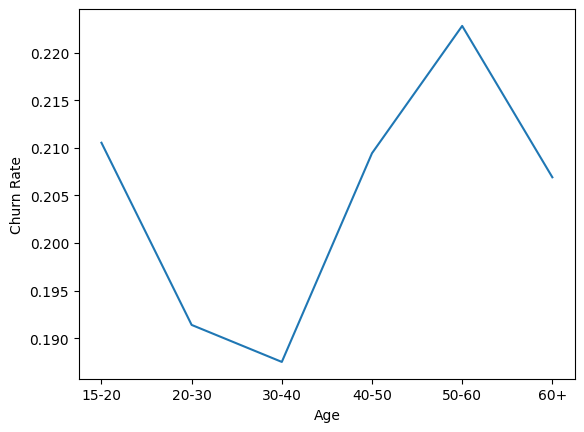

In [15]:
Agerange_distribution = pd.crosstab(Customer_Demographics["Age_range"],Customer_Demographics["ChurnStatus"],normalize="index").reset_index()
plt.plot(Agerange_distribution["Age_range"],Agerange_distribution[1])
plt.xlabel("Age")
plt.ylabel("Churn Rate")
plt.savefig("Plots/agerange_churn_rate.png", dpi=300, bbox_inches='tight')  
plt.show()

In [18]:
average_churn_rate = sum(Customer_Demographics['ChurnStatus'])/Customer_Demographics.shape[0]
average_churn_rate

0.204

In [19]:
def cal_Zscore(Customer_Demographics, input_col, target_col):
    average_churn_rate = sum(Customer_Demographics[target_col])/Customer_Demographics.shape[0]
    
    Distribution = pd.crosstab(Customer_Demographics[input_col],Customer_Demographics[target_col],normalize="index").reset_index()
    Distribution['number'] = Distribution[input_col].map(Customer_Demographics.groupby(input_col).size().astype(float))
    Distribution["sigma"] = Distribution[0]*Distribution[1]/Distribution['number'].astype(float)
    Distribution["Zscore_"+input_col+"diff"] = (Distribution[1]-average_churn_rate)/Distribution["sigma"]
    
    df = pd.merge(Customer_Demographics, Distribution[[input_col, "Zscore_"+input_col+"diff"]], how = "left", on = input_col)
    
    return df,Distribution,average_churn_rate

In [20]:
Gender_Distribution = cal_Zscore(Customer_Demographics, "Gender", "ChurnStatus")[1]
Age_rangeDistribution = cal_Zscore(Customer_Demographics, "Age_range", "ChurnStatus")[1]
MaritalStatus_Distribution = cal_Zscore(Customer_Demographics, "MaritalStatus", "ChurnStatus")[1]
IncomeLevel_Distribution = cal_Zscore(Customer_Demographics, "IncomeLevel", "ChurnStatus")[1]

/var/folders/pt/0nf2m3pj1f3b373wsyfc6glh0000gn/T/ipykernel_52421/1435638261.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  Distribution['number'] = Distribution[input_col].map(Customer_Demographics.groupby(input_col).size().astype(float))


In [21]:
distributions = {
    "Gender": Gender_Distribution,
    "Age_range":Age_rangeDistribution,
    "MaritalStatus":MaritalStatus_Distribution,
    "IncomeLevel":IncomeLevel_Distribution
}

def merge_distribution(ori_df, dic):
    
    data = ori_df

    for key, distribution in dic.items():
        data = pd.merge(data, distribution[[key,"Zscore_"+key+"diff"]], how="left", on = key)
        
    return data 

enhanced_Customer_Demographics = merge_distribution(Customer_Demographics, distributions) 

In [22]:
enhanced_Customer_Demographics= pd.get_dummies(enhanced_Customer_Demographics, columns=["Gender", "Age_range", 'MaritalStatus', 'IncomeLevel'], drop_first=True)
enhanced_Customer_Demographics

,CustomerID,Age,ChurnStatus,Zscore_Genderdiff,Zscore_Age_rangediff,Zscore_MaritalStatusdiff,Zscore_IncomeLeveldiff,Gender_M,Age_range_20-30,Age_range_30-40,Age_range_40-50,Age_range_50-60,Age_range_60+,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widowed,IncomeLevel_Low,IncomeLevel_Medium
0,1,62,0,21.898796,3.071478,0.860114,33.051301,True,False,False,False,False,True,False,True,False,True,False
1,2,65,1,21.898796,3.071478,38.161316,33.051301,True,False,False,False,False,True,True,False,False,True,False
2,3,18,0,21.898796,2.238200,0.860114,33.051301,True,False,False,False,False,False,False,True,False,True,False
3,4,21,0,21.898796,-17.033005,-14.640432,33.051301,True,True,False,False,False,False,False,False,True,True,False
4,5,21,0,21.898796,-17.033005,-30.394573,-9.421698,True,True,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,54,0,-23.096539,20.951841,0.860114,33.051301,False,False,False,False,True,False,False,True,False,True,False
996,997,19,0,21.898796,2.238200,-14.640432,-27.049698,True,False,False,False,False,False,False,False,True,False,False
997,998,47,0,21.898796,6.257337,38.161316,33.051301,True,False,False,True,False,False,True,False,False,True,False
998,999,23,0,21.898796,-17.033005,-14.640432,-27.049698,True,True,False,False,False,False,False,False,True,False,False


<Axes: >

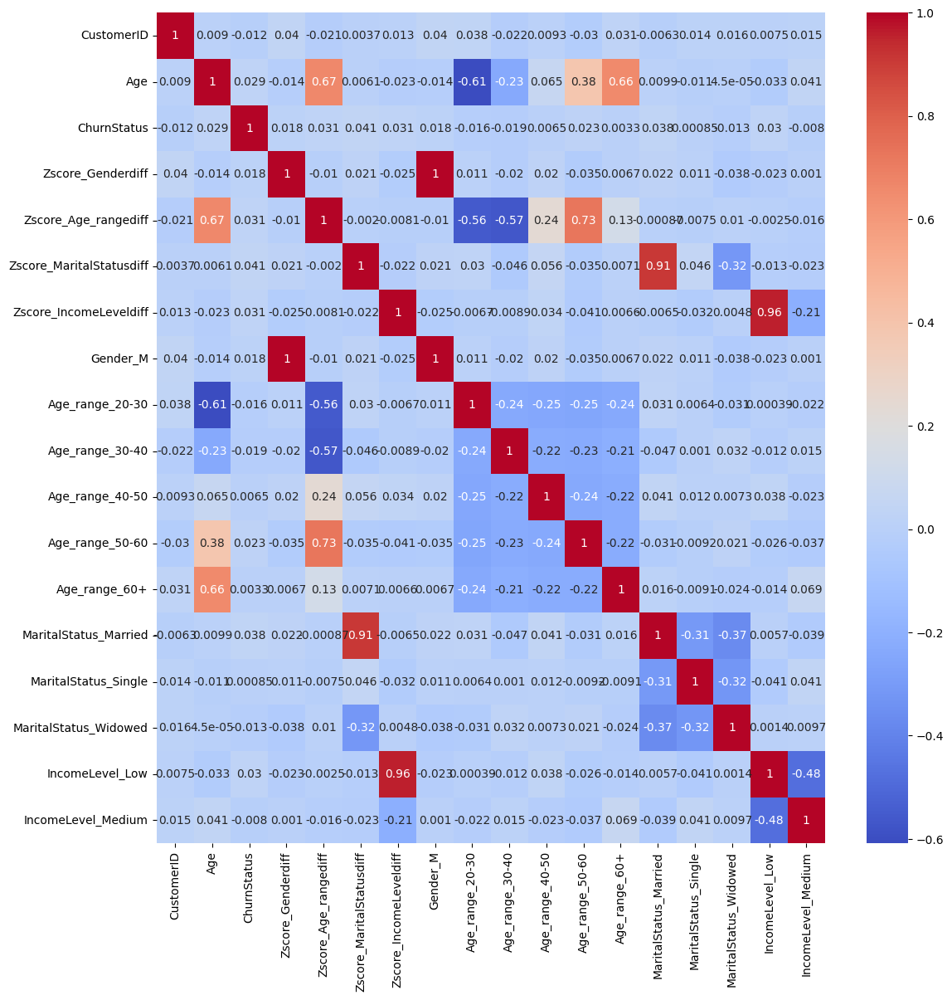

In [24]:
corr_df = enhanced_Customer_Demographics.corr()

plt.figure(figsize=(13, 13))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')

## Cusomer Service sheet

In [25]:
Customer_Service = data['Customer_Service']
Customer_Service = pd.merge(Customer_Service, data['Churn_Status'], how = "left", on = "CustomerID")

In [26]:
prob_InteractionType = Customer_Service.groupby(["InteractionType","ChurnStatus"])["CustomerID"].nunique().unstack().reset_index()
prob_InteractionType["churn_rate"] = prob_InteractionType[1]/(prob_InteractionType[1]+prob_InteractionType[0])

In [27]:
prob_InteractionType["sigma"] = prob_InteractionType["churn_rate"]*(1-prob_InteractionType["churn_rate"])/(prob_InteractionType[0]+prob_InteractionType[1]).apply(np.sqrt)

In [28]:
avg_prob_InteractionType = prob_InteractionType[1].sum() / (prob_InteractionType[0].sum() + prob_InteractionType[1].sum())
prob_InteractionType["Zscore_InteractionType"] = (prob_InteractionType["churn_rate"]- avg_prob_InteractionType)/prob_InteractionType["sigma"]
Customer_Service[Customer_Service["ChurnStatus"] == 0].groupby(["InteractionType","CustomerID"]).size().unstack().reset_index()

CustomerID,InteractionType,1,3,4,6,9,11,12,13,14,...,977,978,980,983,984,985,986,988,992,994
0,Complaint,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,1.0,1.0,1.0,2.0,1.0,NaN,1.0,1.0,NaN,2.0
1,Feedback,NaN,NaN,NaN,1.0,NaN,2.0,1.0,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,1.0,NaN
2,Inquiry,1.0,1.0,2.0,NaN,1.0,NaN,1.0,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN


In [29]:
prob_InteractionType

ChurnStatus,InteractionType,0,1,churn_rate,sigma,Zscore_InteractionType
0,Complaint,233,64,0.215488,0.009809,0.840026
1,Feedback,240,67,0.218241,0.009737,1.128956
2,Inquiry,227,52,0.186380,0.009079,-2.298603


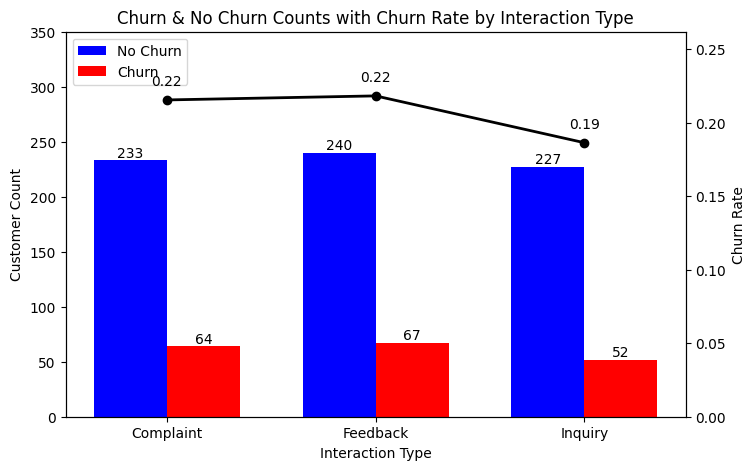

In [36]:
import matplotlib.pyplot as plt
import numpy as np


interaction_types = prob_InteractionType["InteractionType"]
no_churn_counts = prob_InteractionType[0] 
churn_counts = prob_InteractionType[1]  
churn_rates = prob_InteractionType["churn_rate"]  

x = np.arange(len(interaction_types)) 

fig, ax1 = plt.subplots(figsize=(8, 5))
plt.ylim(0,350)
# Bar Chart for Churn & No Churn
bar_width = 0.35
ax1.bar(x - bar_width/2, no_churn_counts, bar_width, label="No Churn", color='blue')
ax1.bar(x + bar_width/2, churn_counts, bar_width, label="Churn", color='red')

ax1.set_xlabel("Interaction Type")
ax1.set_ylabel("Customer Count")
ax1.set_xticks(x)
ax1.set_xticklabels(interaction_types)
ax1.legend(loc="upper left")


ax2 = ax1.twinx() 
ax2.plot(x, churn_rates, color='black', marker='o', linestyle='-', linewidth=2, label="Churn Rate")

ax2.set_ylabel("Churn Rate")
ax2.set_ylim(0, max(churn_rates) * 1.2)  

# Show values on bars
for i in range(len(x)):
    ax1.text(x[i] - bar_width/2, no_churn_counts.iloc[i] + 3, str(no_churn_counts.iloc[i]), ha='center', fontsize=10)
    ax1.text(x[i] + bar_width/2, churn_counts.iloc[i] + 3, str(churn_counts.iloc[i]), ha='center', fontsize=10)
    ax2.text(x[i], churn_rates.iloc[i] + 0.01, f"{churn_rates.iloc[i]:.2f}", ha='center', fontsize=10, color="black")

plt.title("Churn & No Churn Counts with Churn Rate by Interaction Type")
plt.savefig("Plots/churn_rate_interactiontype.png", dpi=300, bbox_inches='tight')
plt.show()


In [37]:
Customer_Service["Status"] = Customer_Service["InteractionType"] +"_"+ Customer_Service["ResolutionStatus"]

In [38]:
final_status = (Customer_Service.groupby("CustomerID", group_keys=False)[["ChurnStatus"]]
                .apply(lambda x : x.iloc[-1] )
                .reset_index()
                .rename(columns={"ChurnStatus": "Status"}))

In [40]:
combined_Customer_Service = (pd.concat([Customer_Service,final_status])
                             .sort_values(by=["CustomerID","InteractionDate"], ascending = [True, True], na_position="last")
                            )
combined_Customer_Service["Status"] = combined_Customer_Service["Status"].replace({0:"Retained",1:"Churned"})

In [41]:
Customer_Service_enhanced = Customer_Service.sort_values(by=["CustomerID", "InteractionDate"]) \
    .groupby("CustomerID").agg(
        First_Interation=('InteractionDate','min'),
        Last_Interation=('InteractionDate','max'),
        Last_Status = ('Status','last')
    )

Customer_Service_enhanced['Duration_Interation'] = \
    (Customer_Service_enhanced['Last_Interation']  - Customer_Service_enhanced['First_Interation']) 

In [42]:

Customer_Service["InteractionDate"] = pd.to_datetime(Customer_Service["InteractionDate"])
Customer_Service = Customer_Service.sort_values(by=["CustomerID", "InteractionDate"])

daily_interactions = Customer_Service.groupby(["CustomerID", "InteractionDate"]).agg(
    Interaction_Count=("InteractionID", "count")  
).reset_index()

daily_interactions["Rolling_Interaction_Count"] = daily_interactions.groupby("CustomerID")["Interaction_Count"] \
    .rolling(window=7, min_periods=1).sum().reset_index(level=0, drop=True)

max_interaction_7d = daily_interactions.loc[daily_interactions.groupby("CustomerID")["Rolling_Interaction_Count"].idxmax()]

test = max_interaction_7d.merge(data["Churn_Status"], how = "left" ,on = "CustomerID")
test[test['ChurnStatus'] == 1].head(10)

,CustomerID,InteractionDate,Interaction_Count,Rolling_Interaction_Count,ChurnStatus
1,2,2022-03-17,1,1.0,1
5,8,2022-09-13,1,2.0,1
12,16,2022-09-08,1,2.0,1
14,18,2022-11-08,1,1.0,1
21,26,2022-12-12,1,1.0,1
27,33,2022-05-30,1,1.0,1
34,41,2022-02-26,1,1.0,1
43,61,2022-04-10,1,1.0,1
46,68,2022-06-06,1,2.0,1
48,71,2022-04-13,1,2.0,1


In [43]:
Customer_Service.groupby("CustomerID")['InteractionType'].value_counts().unstack()
Customer_Service.groupby("CustomerID")['ResolutionStatus'].value_counts().unstack()
Customer_Service.groupby("CustomerID")['Status'].value_counts().unstack()
interaction_statistics = pd.concat([Customer_Service.groupby("CustomerID")['InteractionType'].value_counts().unstack(), Customer_Service.groupby("CustomerID")['ResolutionStatus'].value_counts().unstack(), Customer_Service.groupby("CustomerID")['Status'].value_counts().unstack() ], axis = 1).fillna(0)

In [44]:
chains = combined_Customer_Service.groupby("CustomerID")["Status"].apply(list)
transform = defaultdict(lambda: defaultdict(int))

for i in chains:
    #print(i[0])
    for k in range(len(i)-1):
        src = i[k]
        des = i[k+1]
        transform[src][des] += 1
        #print(src,des)

transform_count = pd.DataFrame(transform).T
transform_prob = transform_count.div(transform_count.sum(axis=1), axis=0)
transform_prob
transform_prob.loc["Retained"] = [1,0,0,0,0,0,0,0]
transform_prob.loc["Churned"] = [0,1,0,0,0,0,0,0]


expected_order = ["Retained", "Churned", "Inquiry_Resolved", "Inquiry_Unresolved" , "Feedback_Resolved", "Feedback_Unresolved", "Complaint_Resolved", "Complaint_Unresolved"]

transform_prob = transform_prob.reindex(index=expected_order, columns=expected_order)
transform_prob

,Retained,Churned,Inquiry_Resolved,Inquiry_Unresolved,Feedback_Resolved,Feedback_Unresolved,Complaint_Resolved,Complaint_Unresolved
Retained,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Churned,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Inquiry_Resolved,0.577381,0.130952,0.053571,0.035714,0.047619,0.077381,0.035714,0.041667
Inquiry_Unresolved,0.546763,0.122302,0.064748,0.028777,0.064748,0.050360,0.064748,0.057554
Feedback_Resolved,0.507538,0.155779,0.035176,0.050251,0.055276,0.075377,0.040201,0.080402
Feedback_Unresolved,0.546584,0.142857,0.043478,0.037267,0.105590,0.062112,0.037267,0.024845
Complaint_Resolved,0.512821,0.115385,0.032051,0.038462,0.083333,0.070513,0.051282,0.096154
Complaint_Unresolved,0.463687,0.178771,0.094972,0.061453,0.078212,0.039106,0.022346,0.061453


In [45]:
combined_Customer_Service

,CustomerID,InteractionID,InteractionDate,InteractionType,ResolutionStatus,ChurnStatus,Status
0,1,6363.0,2022-03-31,Inquiry,Resolved,0.0,Inquiry_Resolved
0,1,NaN,NaT,NaN,NaN,NaN,Retained
1,2,3329.0,2022-03-17,Inquiry,Resolved,1.0,Inquiry_Resolved
1,2,NaN,NaT,NaN,NaN,NaN,Churned
2,3,9976.0,2022-08-24,Inquiry,Resolved,0.0,Inquiry_Resolved
...,...,...,...,...,...,...,...
1000,994,8508.0,2022-05-14,Complaint,Unresolved,0.0,Complaint_Unresolved
999,994,3087.0,2022-07-02,Complaint,Unresolved,0.0,Complaint_Unresolved
666,994,NaN,NaT,NaN,NaN,NaN,Retained
1001,995,9101.0,2022-05-02,Inquiry,Resolved,1.0,Inquiry_Resolved


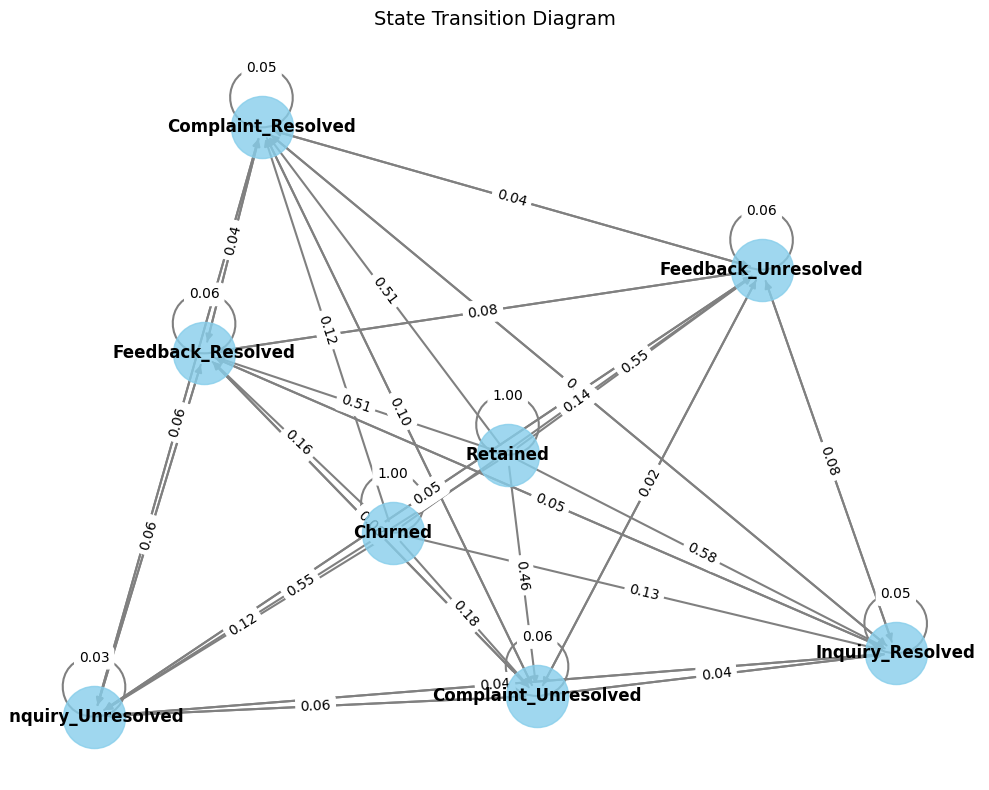

In [47]:
G = nx.DiGraph()


for src in transform_prob.columns:
    for dst in transform_prob.index:
        prob = transform_prob.loc[dst, src]
        if prob > 0:
            G.add_edge(src, dst, weight=prob)


pos = nx.spring_layout(G, seed=42)  
#pos = nx.kamada_kawai_layout(G)
#pos = nx.shell_layout(G)
#pos = nx.circular_layout(G)
#pos = nx.spectral_layout(G)
#pos = nx.multipartite_layout(G, subset_key="layer")


plt.figure(figsize=(10, 8))
nx.draw_networkx_nodes(G, pos, node_size=2000, node_color="skyblue", alpha=0.8)
nx.draw_networkx_edges(G, pos, width=1.5, edge_color="gray", arrows=True)

edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in G.edges(data=True)}
nx.draw_networkx_labels(G, pos, font_size=12, font_weight="bold")
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10)


plt.title("State Transition Diagram", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.savefig("Plots/chain_interactiontype.png", dpi=300, bbox_inches='tight')
plt.show()

In [48]:
labels = list(transform_prob.columns) 
source = []  
target = [] 
value = []  

for src_idx, src in enumerate(transform_prob.columns):
    for dst_idx, dst in enumerate(transform_prob.index):
        prob = transform_prob.loc[dst, src]
        if prob > 0:
            target.append(src_idx)
            source.append(len(labels) + dst_idx)  
            value.append(prob)


labels += list(transform_prob.index)


fig = go.Figure(go.Sankey(
    node=dict(
        pad=20,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color=["#90EE90", "#FFB6C1", "#FF4500", "#32CD32"] * 2  
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color="rgba(128, 128, 128, 0.5)" 
    )
))

fig.update_layout(
    title_text="State Transition Flow",
    font_size=12,
    height=600
)
fig.show()

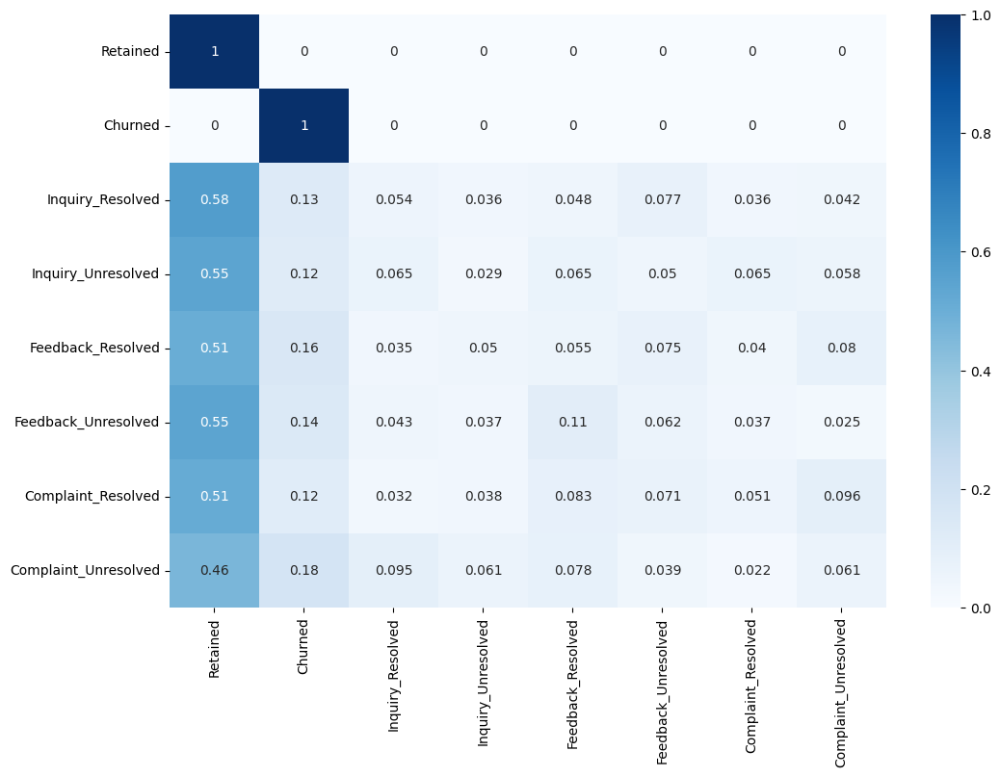

In [49]:
plt.figure(figsize=(12,8))
sns.heatmap(transform_prob.fillna(0), annot=True, cmap='Blues')
#plt.title("State Transition Probability Matrix")
plt.savefig("Plots/transition_matrix.png", dpi=300, bbox_inches='tight')
plt.show()

In [50]:
import scipy.linalg

P = np.array(transform_prob)

absorbing_states = np.where(np.diag(P) == 1)[0]
transient_states = np.where(np.diag(P) != 1)[0]

Q = P[np.ix_(transient_states, transient_states)]
R = P[np.ix_(transient_states, absorbing_states)]

# N = (I - Q)^(-1)
I = np.eye(Q.shape[0])
N = np.linalg.inv(I - Q)

# B = N @ R
B = N @ R
print("Absorb Prob Matrix B：\n", B)


Absorb Prob Matrix B：
 [[0.80700758 0.19299242]
 [0.80678326 0.19321674]
 [0.77081632 0.22918368]
 [0.79064724 0.20935276]
 [0.80247131 0.19752869]
 [0.74481898 0.25518102]]


In [51]:
B

array([[0.80700758, 0.19299242],
       [0.80678326, 0.19321674],
       [0.77081632, 0.22918368],
       [0.79064724, 0.20935276],
       [0.80247131, 0.19752869],
       [0.74481898, 0.25518102]])

In [52]:
Absorb_Matrix = {
    'Inquiry_Resolved': B[0,1],
    'Inquiry_Unresolved': B[1,1],
    'Feedback_Resolved': B[2,1],
    'Feedback_Unresolved': B[3,1],
    'Complaint_Resolved': B[4,1],
    'Complaint_Unresolved': B[5,1]
}

interaction_statistics['Markov_Churn_prob'] = Customer_Service_enhanced['Last_Status'].map(Absorb_Matrix)

In [54]:
#interaction_statistics
Customer_Service_enhanced

,First_Interation,Last_Interation,Last_Status,Duration_Interation
CustomerID,,,,
1,2022-03-31,2022-03-31,Inquiry_Resolved,0 days
2,2022-03-17,2022-03-17,Inquiry_Resolved,0 days
3,2022-08-24,2022-08-24,Inquiry_Resolved,0 days
4,2022-07-03,2022-11-18,Inquiry_Resolved,138 days
6,2022-05-05,2022-05-05,Feedback_Resolved,0 days
...,...,...,...,...
989,2022-08-03,2022-10-07,Complaint_Unresolved,65 days
990,2022-09-17,2022-10-25,Complaint_Unresolved,38 days
992,2022-09-29,2022-09-29,Feedback_Unresolved,0 days


In [55]:
enhanced_Interaction_Customer = enhanced_Customer_Demographics.merge(Customer_Service_enhanced['Duration_Interation'], how = "left", on = "CustomerID")\
                            .merge(interaction_statistics['Markov_Churn_prob'], how = "left", on = 'CustomerID')

In [56]:
enhanced_Interaction_Customer

,CustomerID,Age,ChurnStatus,Zscore_Genderdiff,Zscore_Age_rangediff,Zscore_MaritalStatusdiff,Zscore_IncomeLeveldiff,Gender_M,Age_range_20-30,Age_range_30-40,Age_range_40-50,Age_range_50-60,Age_range_60+,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widowed,IncomeLevel_Low,IncomeLevel_Medium,Duration_Interation,Markov_Churn_prob
0,1,62,0,21.898796,3.071478,0.860114,33.051301,True,False,False,False,False,True,False,True,False,True,False,0 days,0.192992
1,2,65,1,21.898796,3.071478,38.161316,33.051301,True,False,False,False,False,True,True,False,False,True,False,0 days,0.192992
2,3,18,0,21.898796,2.238200,0.860114,33.051301,True,False,False,False,False,False,False,True,False,True,False,0 days,0.192992
3,4,21,0,21.898796,-17.033005,-14.640432,33.051301,True,True,False,False,False,False,False,False,True,True,False,138 days,0.192992
4,5,21,0,21.898796,-17.033005,-30.394573,-9.421698,True,True,False,False,False,False,False,False,False,False,True,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,54,0,-23.096539,20.951841,0.860114,33.051301,False,False,False,False,True,False,False,True,False,True,False,NaT,NaN
996,997,19,0,21.898796,2.238200,-14.640432,-27.049698,True,False,False,False,False,False,False,False,True,False,False,NaT,NaN
997,998,47,0,21.898796,6.257337,38.161316,33.051301,True,False,False,True,False,False,True,False,False,True,False,NaT,NaN
998,999,23,0,21.898796,-17.033005,-14.640432,-27.049698,True,True,False,False,False,False,False,False,True,False,False,NaT,NaN


In [68]:
Customer_Service_count = Customer_Service.groupby(["CustomerID","InteractionType"])["InteractionType"].size().unstack().fillna(0)

In [69]:
Customer_Service_resolutioncount = Customer_Service.groupby(["CustomerID","ResolutionStatus"])["ResolutionStatus"].size().unstack().fillna(0)

In [57]:
enhanced_Interaction_Customer['Duration_Interation'] = enhanced_Interaction_Customer['Duration_Interation'].fillna(pd.Timedelta(days=0))
enhanced_Interaction_Customer['Markov_Churn_prob'] = enhanced_Interaction_Customer['Markov_Churn_prob'].fillna(0)

In [72]:
enhanced_Interaction_Customer = enhanced_Interaction_Customer.merge(Customer_Service_count, how = "left", on = "CustomerID").merge(Customer_Service_resolutioncount, how = "left", on = "CustomerID").fillna(0)

In [74]:
enhanced_Interaction_Customer

,CustomerID,Age,ChurnStatus,Zscore_Genderdiff,Zscore_Age_rangediff,Zscore_MaritalStatusdiff,Zscore_IncomeLeveldiff,Gender_M,Age_range_20-30,Age_range_30-40,...,MaritalStatus_Widowed,IncomeLevel_Low,IncomeLevel_Medium,Duration_Interation,Markov_Churn_prob,Complaint,Feedback,Inquiry,Resolved,Unresolved
0,1,62,0,21.898796,3.071478,0.860114,33.051301,True,False,False,...,False,True,False,0 days,0.192992,0.0,0.0,1.0,1.0,0.0
1,2,65,1,21.898796,3.071478,38.161316,33.051301,True,False,False,...,False,True,False,0 days,0.192992,0.0,0.0,1.0,1.0,0.0
2,3,18,0,21.898796,2.238200,0.860114,33.051301,True,False,False,...,False,True,False,0 days,0.192992,0.0,0.0,1.0,1.0,0.0
3,4,21,0,21.898796,-17.033005,-14.640432,33.051301,True,True,False,...,True,True,False,138 days,0.192992,0.0,0.0,2.0,1.0,1.0
4,5,21,0,21.898796,-17.033005,-30.394573,-9.421698,True,True,False,...,False,False,True,0 days,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,54,0,-23.096539,20.951841,0.860114,33.051301,False,False,False,...,False,True,False,0 days,0.000000,0.0,0.0,0.0,0.0,0.0
996,997,19,0,21.898796,2.238200,-14.640432,-27.049698,True,False,False,...,True,False,False,0 days,0.000000,0.0,0.0,0.0,0.0,0.0
997,998,47,0,21.898796,6.257337,38.161316,33.051301,True,False,False,...,False,True,False,0 days,0.000000,0.0,0.0,0.0,0.0,0.0
998,999,23,0,21.898796,-17.033005,-14.640432,-27.049698,True,True,False,...,True,False,False,0 days,0.000000,0.0,0.0,0.0,0.0,0.0


<Axes: >

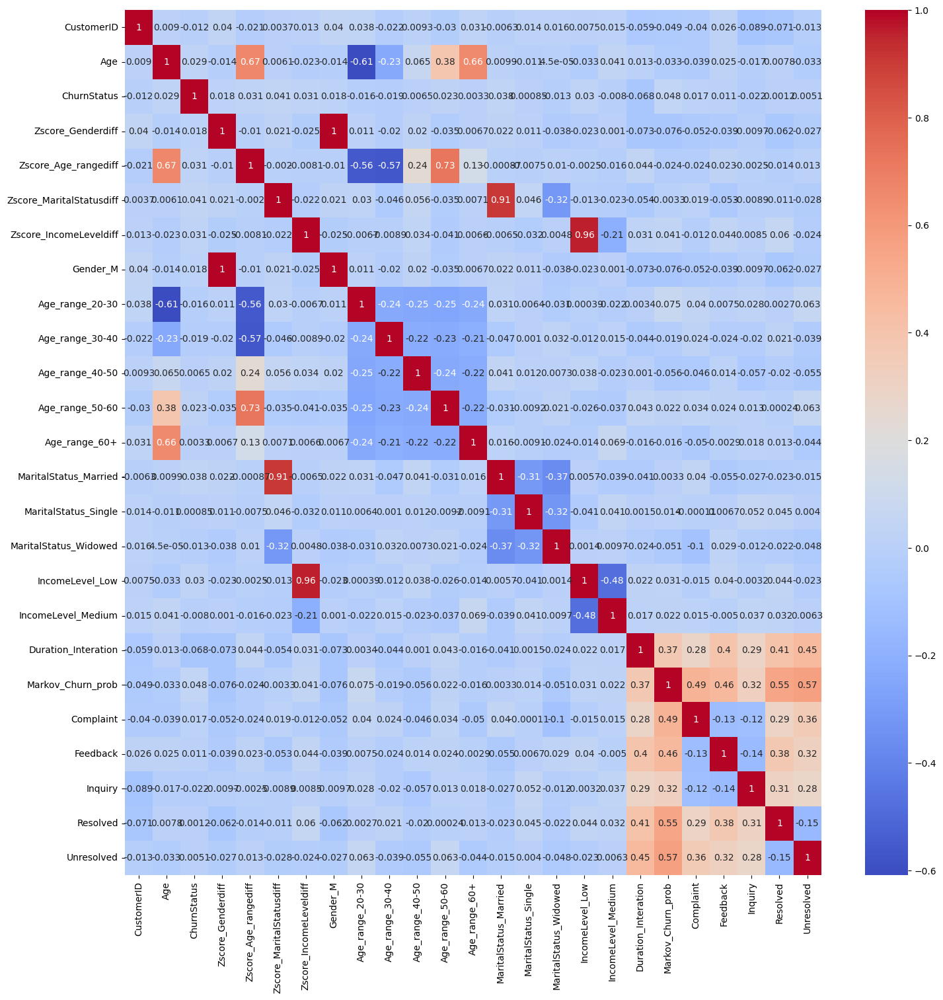

In [76]:
corr_df = enhanced_Interaction_Customer.corr()

plt.figure(figsize=(17, 17))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')

## Transaction Sheet

In [77]:
Transaction_History = data["Transaction_History"]
Transaction_History = Transaction_History.merge(data['Churn_Status'], how = "left", on = "CustomerID")
Transaction_History

,CustomerID,TransactionID,TransactionDate,AmountSpent,ProductCategory,ChurnStatus
0,1,7194,2022-03-27,416.50,Electronics,0
1,2,7250,2022-08-08,54.96,Clothing,1
2,2,9660,2022-07-25,197.50,Electronics,1
3,2,2998,2022-01-25,101.31,Furniture,1
4,2,1228,2022-07-24,397.37,Clothing,1
...,...,...,...,...,...,...
5049,1000,2724,2022-09-08,232.06,Groceries,0
5050,1000,2917,2022-12-13,324.98,Books,0
5051,1000,2979,2022-06-15,375.34,Groceries,0
5052,1000,8594,2022-04-08,166.73,Books,0


In [78]:
df_diff = Transaction_History.groupby(["CustomerID","ProductCategory"])["AmountSpent"].agg(
    First_Transaction="min",
    Last_Transaction="max",
    total_Transaction = "sum",
    mean_Transaction = "mean",
    count_Transaction = "count"
)

df_diff["Days_Difference"] = (df_diff["Last_Transaction"] - df_diff["First_Transaction"])
df_diff.reset_index().head(50)

,CustomerID,ProductCategory,First_Transaction,Last_Transaction,total_Transaction,mean_Transaction,count_Transaction,Days_Difference
0,1,Electronics,416.50,416.50,416.50,416.500000,1,0.00
1,2,Clothing,54.96,397.37,452.33,226.165000,2,342.41
2,2,Electronics,197.50,311.34,794.05,264.683333,3,113.84
3,2,Furniture,101.31,101.31,101.31,101.310000,1,0.00
4,2,Groceries,199.73,199.73,199.73,199.730000,1,0.00
5,3,Books,241.06,241.06,241.06,241.060000,1,0.00
6,3,Clothing,51.07,51.07,51.07,51.070000,1,0.00
7,3,Furniture,403.32,419.95,823.27,411.635000,2,16.63
8,3,Groceries,287.72,299.86,587.58,293.790000,2,12.14
9,4,Clothing,44.22,44.22,44.22,44.220000,1,0.00


In [79]:
Transaction_History["TransactionDate"] = pd.to_datetime(Transaction_History["TransactionDate"])
Transaction_History = Transaction_History.sort_values(by=["CustomerID", "TransactionDate"])


daily_spending = Transaction_History.groupby(["CustomerID", "TransactionDate"]).agg(
    Transaction_Count=("TransactionID", "count"),  
    Total_Spent=("AmountSpent", "sum")            
).reset_index()


daily_spending["Rolling_Transaction_Count"] = daily_spending.groupby("CustomerID")["Transaction_Count"].rolling(window=2, min_periods=1).sum().reset_index(level=0, drop=True)
daily_spending["Rolling_Total_Spent"] = daily_spending.groupby("CustomerID")["Total_Spent"].rolling(window=2, min_periods=1).sum().reset_index(level=0, drop=True)


max_transaction_7d = daily_spending.loc[daily_spending.groupby("CustomerID")["Rolling_Transaction_Count"].idxmax()]


max_spent_7d = daily_spending.loc[daily_spending.groupby("CustomerID")["Rolling_Total_Spent"].idxmax()]

print("How many times spent in 7 days at most? \n", max_transaction_7d.merge(data["Churn_Status"],how = "left", on = "CustomerID").head(20))
print("How much spent in 7 days at most? \n", max_spent_7d.merge(data["Churn_Status"],how = "left", on = "CustomerID").head(20))


How many times spent in 7 days at most? 
     CustomerID TransactionDate  Transaction_Count  Total_Spent  \
0            1      2022-03-27                  1       416.50   
1            2      2022-01-25                  1       101.31   
2            3      2022-03-02                  1       299.86   
3            4      2022-07-31                  1       125.64   
4            5      2022-05-25                  1        69.86   
5            6      2022-08-09                  1        41.70   
6            7      2022-10-24                  1        86.73   
7            8      2022-06-10                  1       346.24   
8            9      2022-05-26                  1       325.96   
9           10      2022-06-05                  1       179.00   
10          11      2022-06-06                  1       334.62   
11          12      2022-11-02                  1        87.10   
12          13      2022-08-10                  1       164.72   
13          14      2022-02-21    

In [80]:

Transaction_History["TransactionDate"] = pd.to_datetime(Transaction_History["TransactionDate"])


Transaction_History = Transaction_History.sort_values(by=["CustomerID", "ProductCategory", "TransactionDate"])

daily_spending = Transaction_History.groupby(["CustomerID", "ProductCategory", "TransactionDate"]).agg(
    Transaction_Count=("TransactionID", "count"),  
    Total_Spent=("AmountSpent", "sum")            
).reset_index()


daily_spending["Rolling_Transaction_Count"] = daily_spending.groupby(["CustomerID", "ProductCategory"])["Transaction_Count"] \
    .rolling(window=7, min_periods=1).sum().reset_index(level=[0,1], drop=True)

daily_spending["Rolling_Total_Spent"] = daily_spending.groupby(["CustomerID", "ProductCategory"])["Total_Spent"] \
    .rolling(window=7, min_periods=1).sum().reset_index(level=[0,1], drop=True)


daily_spending = daily_spending.dropna(subset=["Rolling_Transaction_Count", "Rolling_Total_Spent"])


max_transaction_7d = daily_spending.loc[daily_spending.groupby(["CustomerID", "ProductCategory"])["Rolling_Transaction_Count"].idxmax()]


max_spent_7d = daily_spending.loc[daily_spending.groupby(["CustomerID", "ProductCategory"])["Rolling_Total_Spent"].idxmax()]


churn_data = data["Churn_Status"][["CustomerID", "ChurnStatus"]]
max_transaction_7d = max_transaction_7d.merge(churn_data, how="left", on="CustomerID")
max_spent_7d = max_spent_7d.merge(churn_data, how="left", on="CustomerID")



In [81]:
Transaction_History["TransactionDate"] = pd.to_datetime(Transaction_History["TransactionDate"])


Transaction_History = Transaction_History.sort_values(by=["CustomerID", "ProductCategory", "TransactionDate"])


daily_spending = Transaction_History.groupby(["CustomerID", "ProductCategory", "TransactionDate"]).agg(
    Transaction_Count=("TransactionID", "count"),  
    Total_Spent=("AmountSpent", "sum")             
).reset_index()

In [82]:
test = daily_spending.groupby("CustomerID")['Total_Spent'].rolling(window=7, min_periods=1).sum().reset_index(level=0).groupby("CustomerID").max()

In [83]:
test_1 = test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 1]

In [84]:
test_0 = test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 0]

In [85]:
df_diff = df_diff.reset_index().merge(data["Churn_Status"], how="left", on="CustomerID")

In [86]:
all_total_spent = df_diff.groupby("CustomerID")["total_Transaction"].sum()
all_mean_spent = df_diff.groupby("CustomerID")["total_Transaction"].mean()
all_total_spent = all_total_spent.reset_index().merge(data["Churn_Status"], how="left", on="CustomerID")
all_mean_spent = all_mean_spent.reset_index().merge(data["Churn_Status"], how="left", on="CustomerID")

<Axes: xlabel='ChurnStatus', ylabel='total_Transaction'>

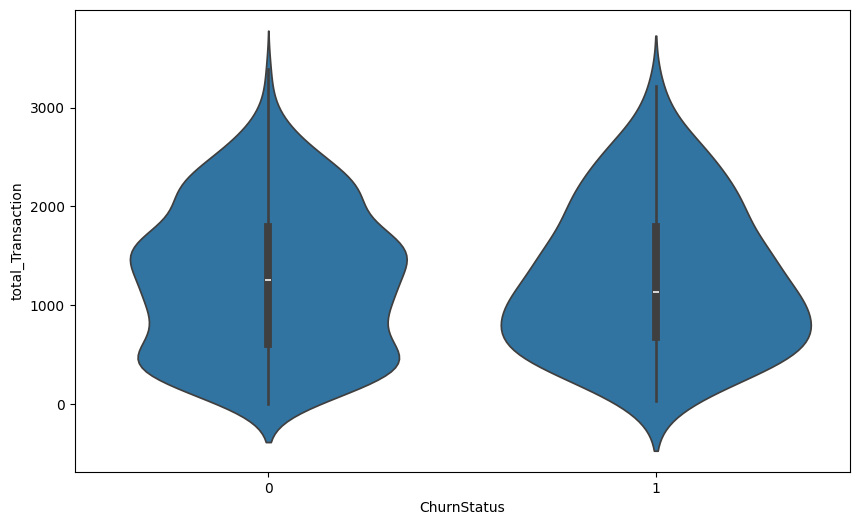

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
sns.violinplot(x="ChurnStatus" , y= "total_Transaction"
               , data=all_total_spent)

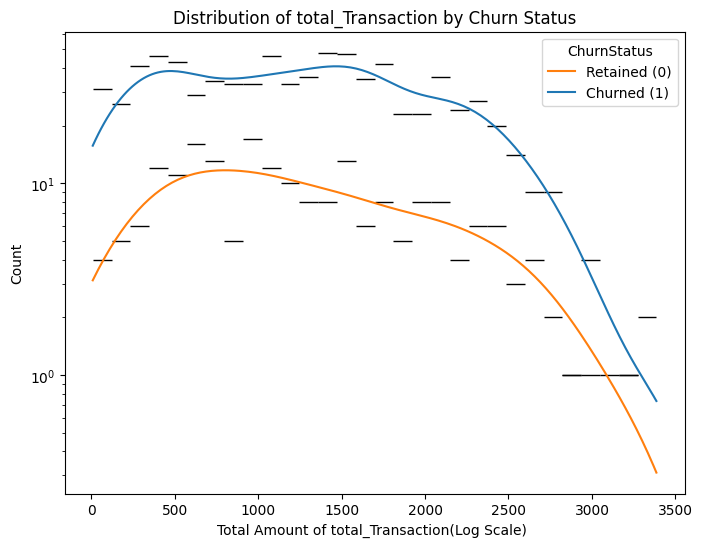

In [88]:
plt.figure(figsize=(8,6))

sns.histplot(data=all_total_spent, x="total_Transaction", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of total_Transaction by Churn Status")
plt.xlabel("Total Amount of total_Transaction(Log Scale) ")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


<Axes: xlabel='ChurnStatus', ylabel='total_Transaction'>

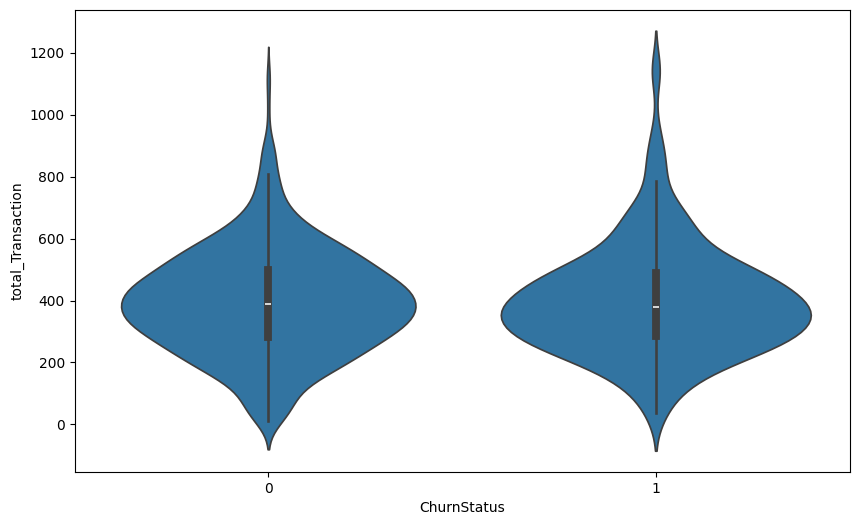

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
sns.violinplot(x="ChurnStatus" , y= "total_Transaction"
               , data=all_mean_spent)

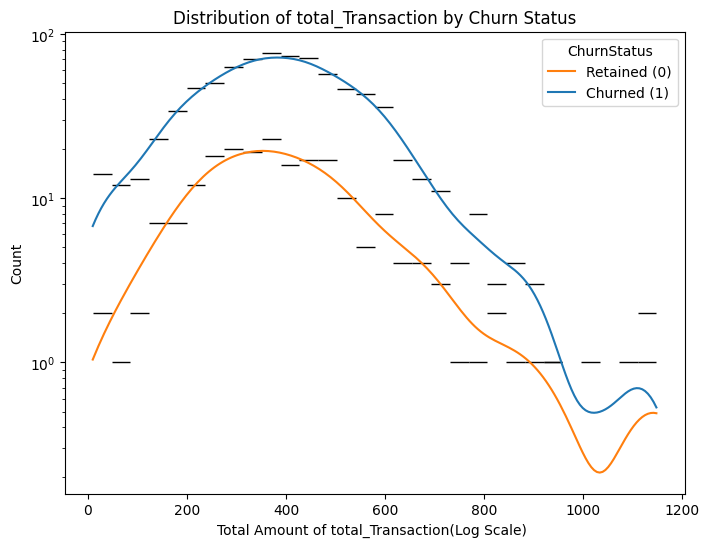

In [90]:
plt.figure(figsize=(8,6))

sns.histplot(data=all_mean_spent, x="total_Transaction", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of total_Transaction by Churn Status")
plt.xlabel("Total Amount of total_Transaction(Log Scale) ")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


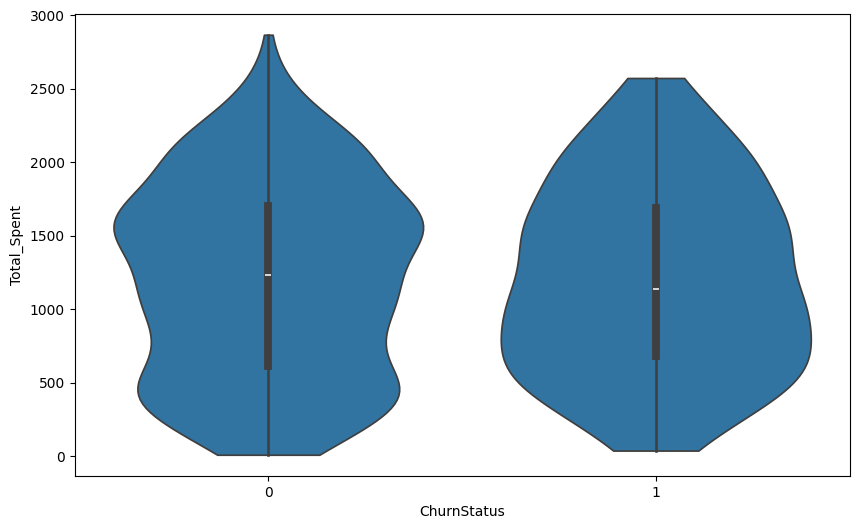

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.violinplot(x="ChurnStatus" , y= "Total_Spent"
               , data=test.merge(data["Churn_Status"], how="left", on="CustomerID"), cut = 0)
plt.savefig("Plots/violin_total_spent.png", dpi=300, bbox_inches='tight')

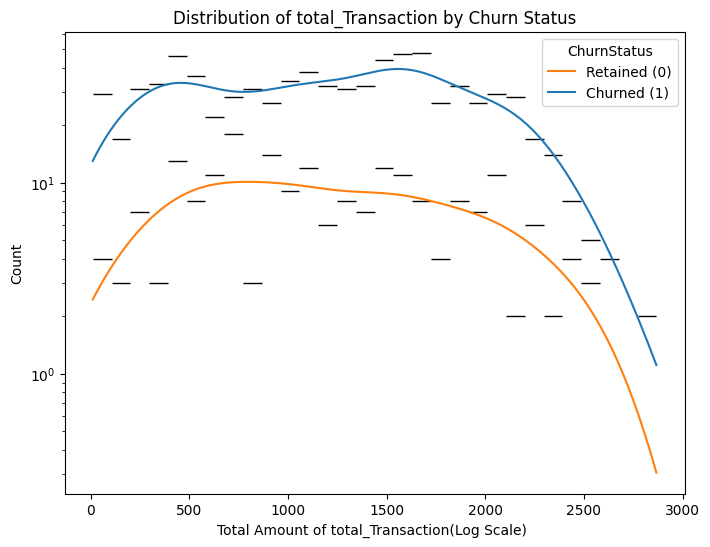

In [92]:
plt.figure(figsize=(8,6))

sns.histplot(data=test.merge(data["Churn_Status"], how="left", on="CustomerID"), x="Total_Spent", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of total_Transaction by Churn Status")
plt.xlabel("Total Amount of total_Transaction(Log Scale) ")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


In [93]:
test.merge(data["Churn_Status"], how="left", on="CustomerID")

,CustomerID,Total_Spent,ChurnStatus
0,1,416.50,0
1,2,1547.42,1
2,3,1702.98,0
3,4,917.29,0
4,5,1692.69,0
...,...,...,...
995,996,227.25,0
996,997,419.82,0
997,998,252.15,0
998,999,2233.24,0


In [94]:
mean_churned = all_total_spent[all_total_spent['ChurnStatus'] == 1]['total_Transaction'].mean()
mean_retained = all_total_spent[all_total_spent['ChurnStatus'] == 0]['total_Transaction'].mean()

print(f"Churned means: {mean_churned:.2f}")
print(f"Retained means: {mean_retained:.2f}")

from scipy.stats import ttest_ind


churned_transactions = all_total_spent[all_total_spent['ChurnStatus'] == 1]['total_Transaction']
retained_transactions = all_total_spent[all_total_spent['ChurnStatus'] == 0]['total_Transaction']


t_stat, p_value = ttest_ind(churned_transactions, retained_transactions, equal_var=False)

print(f"T Statistics: {t_stat:.4f}, P Value: {p_value:.4f}")

if p_value < 0.05:
    print("Refuse H0")
else:
    print("Accept H0")


Churned means: 1269.01
Retained means: 1266.58
T Statistics: 0.0421, P Value: 0.9664
Accept H0


In [95]:
mean_churned = test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 1]['Total_Spent'].mean()
mean_retained = test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 0]['Total_Spent'].mean()

print(f"Churned means {mean_churned:.2f}")
print(f"Retained means: {mean_retained:.2f}")

from scipy.stats import ttest_ind


churned_transactions = test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 1]['Total_Spent']
retained_transactions =test.merge(data["Churn_Status"], how="left", on="CustomerID")[test.merge(data["Churn_Status"], how="left", on="CustomerID")['ChurnStatus'] == 0]['Total_Spent']

t_stat, p_value = ttest_ind(churned_transactions, retained_transactions, equal_var=False)

print(f"T Statistics: {t_stat:.4f}, P Value: {p_value:.4f}")

if p_value < 0.05:
    print("Refuse H0")
else:
    print("Accept H0")


Churned means 1202.08
Retained means: 1206.55
T Statistics: -0.0885, P Value: 0.9295
Accept H0


In [96]:
daily_spending.sort_values('TransactionDate').groupby('CustomerID').apply(lambda x: x.rolling('7D', on='TransactionDate')['Transaction_Count'].sum()).reset_index(level = 0).groupby("CustomerID")['Transaction_Count'].max()

/var/folders/pt/0nf2m3pj1f3b373wsyfc6glh0000gn/T/ipykernel_52421/4214387758.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



CustomerID
1       1.0
2       2.0
3       1.0
4       2.0
5       1.0
       ... 
996     1.0
997     1.0
998     1.0
999     2.0
1000    1.0
Name: Transaction_Count, Length: 1000, dtype: float64

In [97]:
test3 = (
    daily_spending
    .assign(TransactionDate=lambda df: pd.to_datetime(df['TransactionDate']))
    .sort_values(['CustomerID', 'TransactionDate'])
    .set_index('TransactionDate')
    .groupby('CustomerID')['Total_Spent']
    .rolling('7D', closed='left') 
    .sum()
    .reset_index()
    .rename(columns={'Total_Spent': 'Rolling_7D_Sum'})
)

In [98]:
test4 = (
    daily_spending
    .assign(TransactionDate=lambda df: pd.to_datetime(df['TransactionDate']))
    .sort_values(['CustomerID', 'TransactionDate'])
    .set_index('TransactionDate')
    .groupby(['CustomerID','ProductCategory'])['Total_Spent']
    .rolling('7D', closed='left')  
    .sum()
    .reset_index()
    )

In [99]:
test4 = test4.fillna(0).groupby(["CustomerID","ProductCategory"])["Total_Spent"].max().reset_index()
test4 = test4.pivot_table(index="CustomerID", columns="ProductCategory", values="Total_Spent", fill_value=0).add_prefix("Rolling_7D_").reset_index().merge(data["Churn_Status"], how = "left", on = "CustomerID")


In [100]:
test4

,CustomerID,Rolling_7D_Books,Rolling_7D_Clothing,Rolling_7D_Electronics,Rolling_7D_Furniture,Rolling_7D_Groceries,ChurnStatus
0,1,0.0,0.0,0.0,0.0,0.0,0
1,2,0.0,0.0,0.0,0.0,0.0,1
2,3,0.0,0.0,0.0,0.0,0.0,0
3,4,0.0,0.0,0.0,0.0,0.0,0
4,5,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...
995,996,0.0,0.0,0.0,0.0,0.0,0
996,997,0.0,0.0,0.0,0.0,0.0,0
997,998,0.0,0.0,0.0,0.0,0.0,0
998,999,0.0,0.0,0.0,0.0,0.0,0


<Axes: xlabel='ChurnStatus', ylabel='Rolling_7D_Books'>

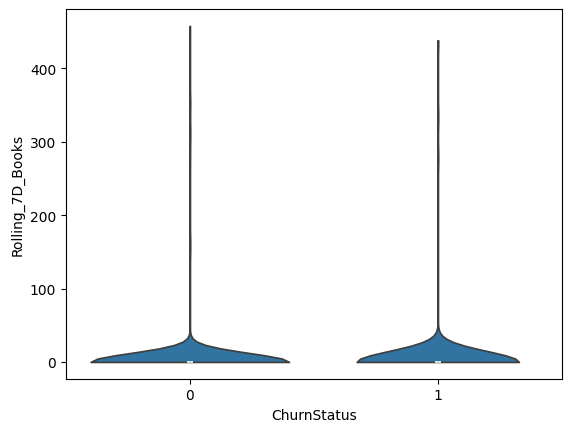

In [62]:
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Books"
               , data=test4, cut = 0)

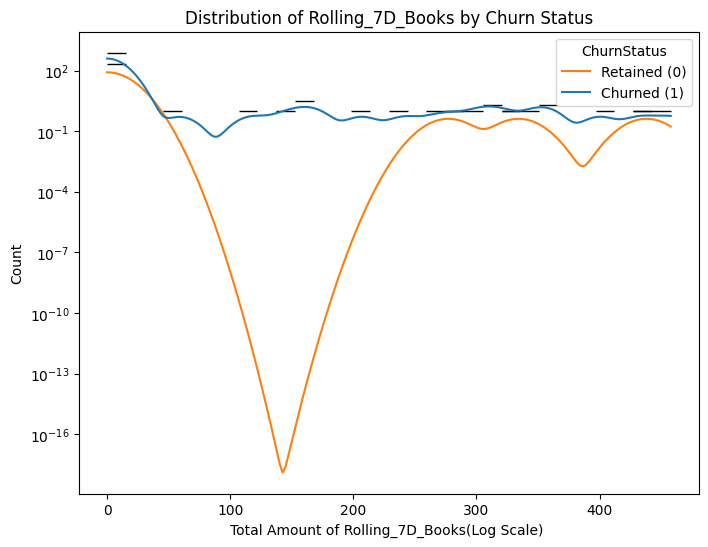

In [63]:
plt.figure(figsize=(8,6))

sns.histplot(data=test4, x="Rolling_7D_Books", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Books by Churn Status")
plt.xlabel("Total Amount of Rolling_7D_Books(Log Scale) ")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


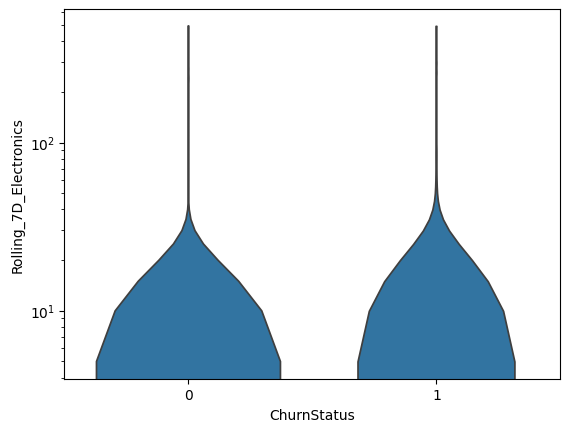

In [64]:
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Electronics"
               , data=test4, cut = 0)
plt.yscale("log")

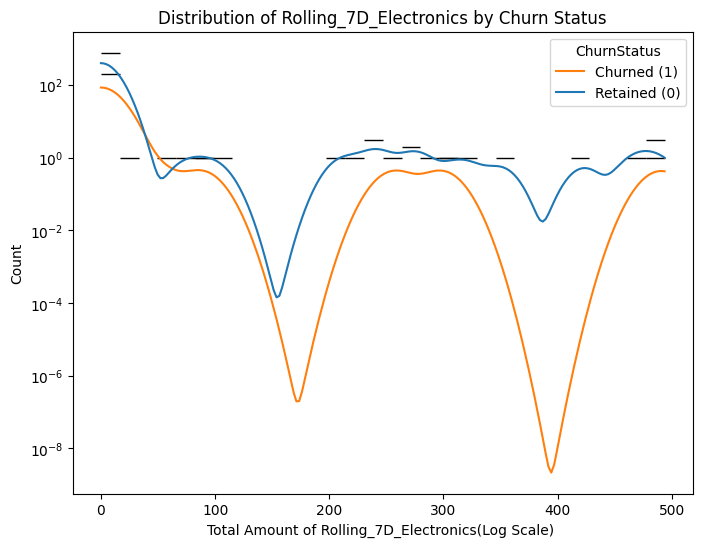

In [107]:
plt.figure(figsize=(8,6))

sns.histplot(data=test4, x="Rolling_7D_Electronics", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Electronics by Churn Status")
plt.xlabel("Total Amount of Rolling_7D_Electronics(Log Scale) ")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Churned (1)","Retained (0)"])  
plt.savefig("Plots/KDE_RollingElectronics.png", dpi=300, bbox_inches='tight')
plt.show()


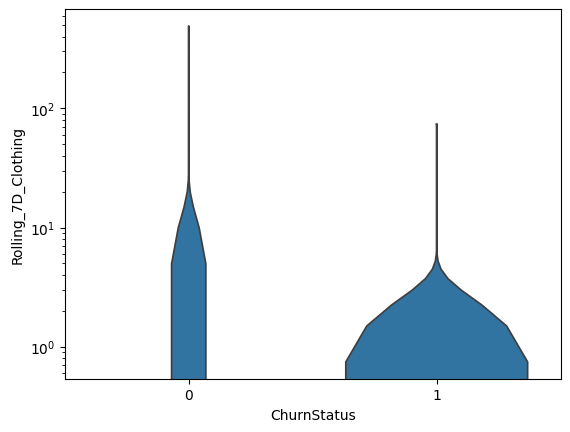

In [66]:
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Clothing"
               , data=test4, cut = 0)
plt.yscale("log")

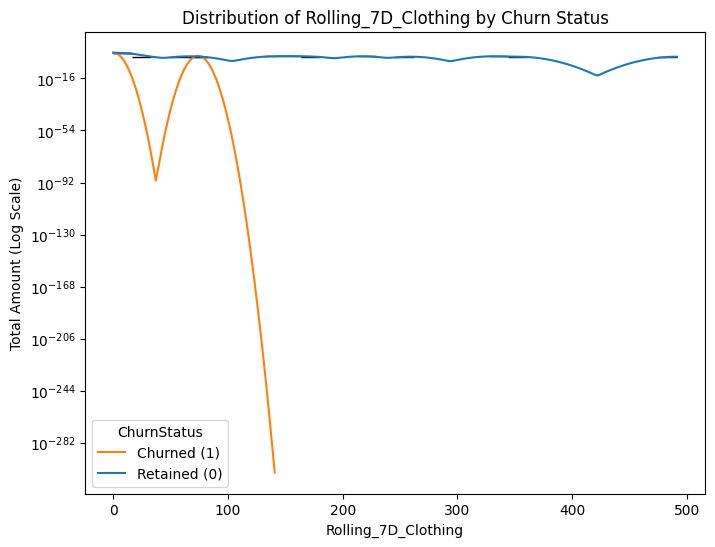

In [108]:
plt.figure(figsize=(8,6))

sns.histplot(data=test4, x="Rolling_7D_Clothing", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Clothing by Churn Status")
plt.xlabel("Rolling_7D_Clothing")
plt.ylabel("Total Amount (Log Scale)")
plt.legend(title="ChurnStatus", labels=["Churned (1)","Retained (0)"])
plt.savefig("Plots/KDE_RollingClothing.png", dpi=300, bbox_inches='tight')
plt.show()


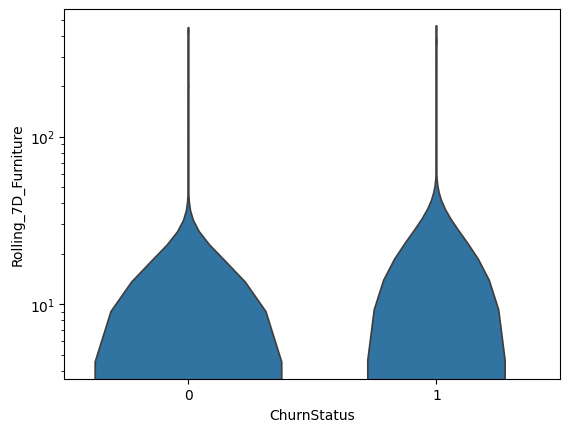

In [109]:
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Furniture"
               , data=test4, cut = 0)
plt.yscale("log")

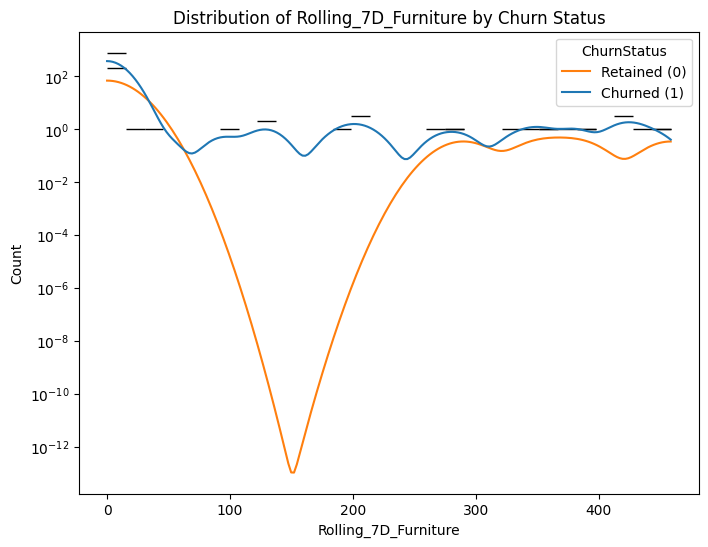

In [110]:
plt.figure(figsize=(8,6))

sns.histplot(data=test4, x="Rolling_7D_Furniture", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Furniture by Churn Status")
plt.xlabel("Rolling_7D_Furniture")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


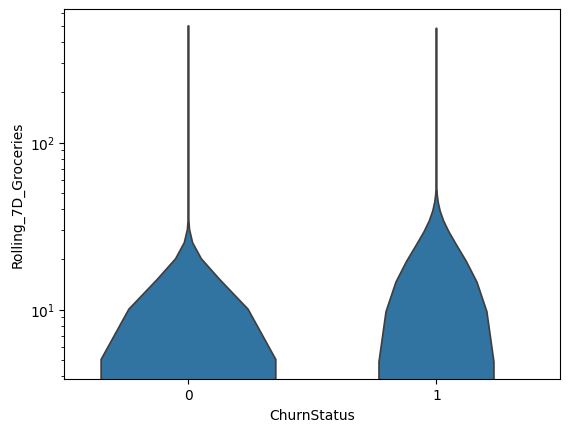

In [111]:
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Groceries"
               , data=test4, cut = 0)
plt.yscale("log")

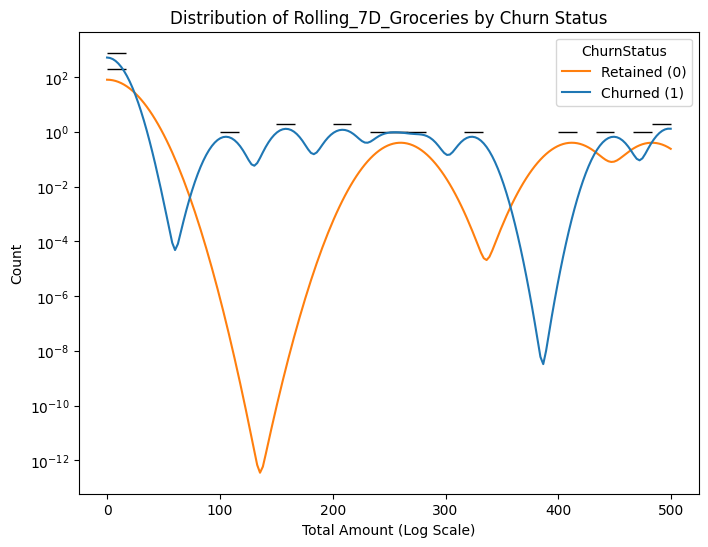

In [112]:
plt.figure(figsize=(8,6))

sns.histplot(data=test4, x="Rolling_7D_Groceries", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Groceries by Churn Status")
plt.xlabel("Total Amount (Log Scale)")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  
plt.show()


In [113]:
test4["Rolling_7D_Furniture_bined"] = pd.cut(test4["Rolling_7D_Furniture"], bins=[0, 100, 210, np.inf], labels=["Rolling_7D_Furniture_100", "Rolling_7D_Furniture_210", "Rolling_7D_Furniture_210+"])

In [114]:
test4["Rolling_7D_Clothing_bined"] = pd.cut(test4["Rolling_7D_Clothing"],bins = [0,10,40,150,np.inf], labels = ["Rolling_7D_Clothing_10","Rolling_7D_Clothing_40","Rolling_7D_Clothing_150","Rolling_7D_Clothing_150+"])

In [115]:
test4["Rolling_7D_Electronics_bined"] = pd.cut(test4["Rolling_7D_Electronics"], bins = [0,160, 200, 310, 360, 420, 440, np.inf], labels=["Rolling_7D_Electronics_160","Rolling_7D_Electronics_200","Rolling_7D_Electronics_310","Rolling_7D_Electronics_360","Rolling_7D_Electronics_420","Rolling_7D_Electronics_440","Rolling_7D_Electronics_440+"])

In [116]:
test4["Rolling_7D_Books_bined"] = pd.cut(test4["Rolling_7D_Books"], bins = [0, 80, 220, np.inf], labels=["Rolling_7D_Books_80","Rolling_7D_Books_220","Rolling_7D_Books_220+"])

In [117]:
test4["Rolling_7D_Groceries_bined"] = pd.cut(test4["Rolling_7D_Groceries"], bins = [0,80, 200, 280, 320,380, 410, np.inf], labels=["Rolling_7D_Groceries_80","Rolling_7D_Groceries_200","Rolling_7D_Groceries_280","Rolling_7D_Groceries_320","Rolling_7D_Groceries_380","Rolling_7D_Groceries_410","Rolling_7D_Groceries_410+"])

In [118]:
test3 = test3.groupby("CustomerID")["Rolling_7D_Sum"].max().reset_index()
test_count = test3.merge(data["Churn_Status"], how = "left", on = "CustomerID")


In [119]:
test_count.fillna(0)

,CustomerID,Rolling_7D_Sum,ChurnStatus
0,1,0.00,0
1,2,397.37,1
2,3,0.00,0
3,4,241.45,0
4,5,0.00,0
...,...,...,...
995,996,0.00,0
996,997,0.00,0
997,998,0.00,0
998,999,80.28,0


In [120]:
count_label = pd.cut(test_count.fillna(0)['Rolling_7D_Sum'], bins = [-1,200,400,600,np.inf],labels = ['Rolling_7D_0-200','Rolling_7D_200-400','Rolling_7D_400-600','Rolling_7D_600+'])

In [121]:
rolling_dummies = pd.get_dummies(count_label)
test_count = pd.concat([test_count, rolling_dummies], axis=1).fillna(0)
test_count = test_count.T.drop_duplicates().T

In [122]:
test_count = test_count.merge(test4, how="left", on = ["CustomerID","ChurnStatus"]).T.drop_duplicates().T

In [123]:
test_count

,CustomerID,Rolling_7D_Sum,ChurnStatus,Rolling_7D_0-200,Rolling_7D_200-400,Rolling_7D_400-600,Rolling_7D_600+,Rolling_7D_Books,Rolling_7D_Clothing,Rolling_7D_Electronics,Rolling_7D_Furniture,Rolling_7D_Groceries,Rolling_7D_Furniture_bined,Rolling_7D_Clothing_bined,Rolling_7D_Electronics_bined,Rolling_7D_Books_bined,Rolling_7D_Groceries_bined
0,1,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,2,397.37,1,False,True,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2,3,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
3,4,241.45,0,False,True,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
4,5,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
996,997,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
997,998,0.0,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
998,999,80.28,0,True,False,False,False,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN


<Axes: xlabel='ChurnStatus', ylabel='Rolling_7D_Sum'>

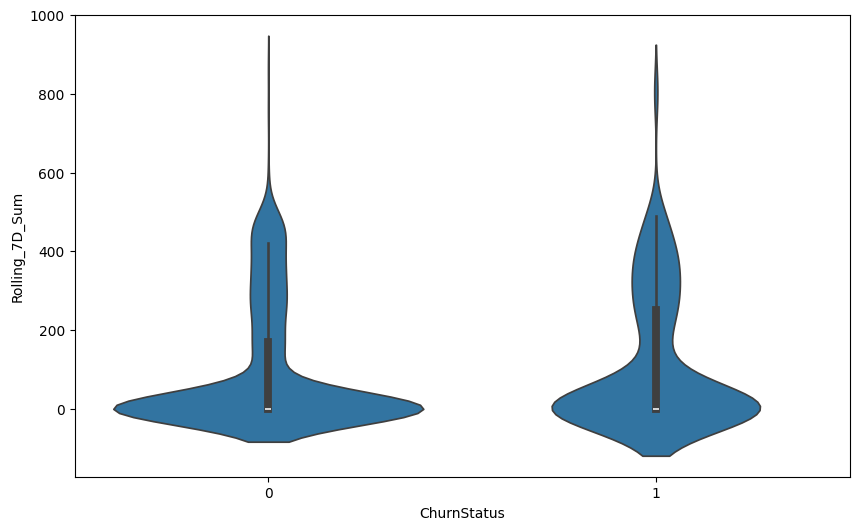

In [124]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.violinplot(x="ChurnStatus" , y= "Rolling_7D_Sum"
               , data=test_count)

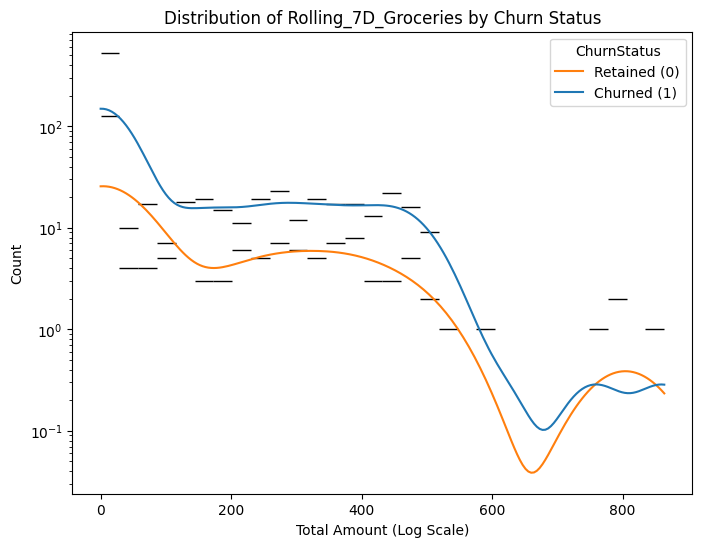

In [125]:
plt.figure(figsize=(8,6))

sns.histplot(data=test_count, x="Rolling_7D_Sum", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, True), alpha=0.5)

plt.title("Distribution of Rolling_7D_Groceries by Churn Status")
plt.xlabel("Total Amount (Log Scale)")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  # 添加清晰图例
plt.show()


In [126]:

duplicate_ids = data["Churn_Status"]["CustomerID"].duplicated().sum()
print(f"repeted columns: {duplicate_ids}")


repeted columns: 0


In [127]:
df_grouped = df_diff.groupby(["ProductCategory","CustomerID"])[["First_Transaction", "Last_Transaction", 
                                            "total_Transaction", "mean_Transaction", 
                                            "count_Transaction"]].sum().reset_index()

df_grouped


,ProductCategory,CustomerID,First_Transaction,Last_Transaction,total_Transaction,mean_Transaction,count_Transaction
0,Books,3,241.06,241.06,241.06,241.060000,1
1,Books,6,365.57,365.57,365.57,365.570000,1
2,Books,7,86.73,86.73,86.73,86.730000,1
3,Books,8,240.92,263.24,504.16,252.080000,2
4,Books,11,163.78,426.06,924.46,308.153333,3
...,...,...,...,...,...,...,...
3092,Groceries,991,201.31,257.17,458.48,229.240000,2
3093,Groceries,994,71.78,336.21,600.40,200.133333,3
3094,Groceries,995,494.90,494.90,494.90,494.900000,1
3095,Groceries,999,260.06,387.96,648.02,324.010000,2


In [128]:
df_pivot = df_diff.pivot_table(index="CustomerID", columns="ProductCategory", values=["First_Transaction",'Last_Transaction','total_Transaction','mean_Transaction','count_Transaction','Days_Difference'], fill_value=0)
df_pivot.columns = ['_'.join(col).strip() for col in df_pivot.columns.values]
df_pivot.reset_index(inplace=True)

In [129]:
df_pivot.columns

Index(['CustomerID', 'Days_Difference_Books', 'Days_Difference_Clothing',
       'Days_Difference_Electronics', 'Days_Difference_Furniture',
       'Days_Difference_Groceries', 'First_Transaction_Books',
       'First_Transaction_Clothing', 'First_Transaction_Electronics',
       'First_Transaction_Furniture', 'First_Transaction_Groceries',
       'Last_Transaction_Books', 'Last_Transaction_Clothing',
       'Last_Transaction_Electronics', 'Last_Transaction_Furniture',
       'Last_Transaction_Groceries', 'count_Transaction_Books',
       'count_Transaction_Clothing', 'count_Transaction_Electronics',
       'count_Transaction_Furniture', 'count_Transaction_Groceries',
       'mean_Transaction_Books', 'mean_Transaction_Clothing',
       'mean_Transaction_Electronics', 'mean_Transaction_Furniture',
       'mean_Transaction_Groceries', 'total_Transaction_Books',
       'total_Transaction_Clothing', 'total_Transaction_Electronics',
       'total_Transaction_Furniture', 'total_Transaction_G

In [130]:
category2 = ["Rolling_7D_Furniture_bined", "Rolling_7D_Electronics_bined", "Rolling_7D_Books_bined", "Rolling_7D_Groceries_bined", "Rolling_7D_Clothing_bined"]
test_count_endcoded = pd.get_dummies(test_count, columns=category2, drop_first=True)
test_count_endcoded.head()

,CustomerID,Rolling_7D_Sum,ChurnStatus,Rolling_7D_0-200,Rolling_7D_200-400,Rolling_7D_400-600,Rolling_7D_600+,Rolling_7D_Books,Rolling_7D_Clothing,Rolling_7D_Electronics,...,Rolling_7D_Electronics_bined_Rolling_7D_Electronics_440+,Rolling_7D_Books_bined_Rolling_7D_Books_220+,Rolling_7D_Books_bined_Rolling_7D_Books_80,Rolling_7D_Groceries_bined_Rolling_7D_Groceries_280,Rolling_7D_Groceries_bined_Rolling_7D_Groceries_320,Rolling_7D_Groceries_bined_Rolling_7D_Groceries_380,Rolling_7D_Groceries_bined_Rolling_7D_Groceries_410+,Rolling_7D_Groceries_bined_Rolling_7D_Groceries_80,Rolling_7D_Clothing_bined_Rolling_7D_Clothing_150+,Rolling_7D_Clothing_bined_Rolling_7D_Clothing_40
0,1,0.0,0,True,False,False,False,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
1,2,397.37,1,False,True,False,False,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
2,3,0.0,0,True,False,False,False,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
3,4,241.45,0,False,True,False,False,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False
4,5,0.0,0,True,False,False,False,0.0,0.0,0.0,...,False,False,False,False,False,False,False,False,False,False


In [131]:
test_count_endcoded.columns

Index(['CustomerID', 'Rolling_7D_Sum', 'ChurnStatus', 'Rolling_7D_0-200',
       'Rolling_7D_200-400', 'Rolling_7D_400-600', 'Rolling_7D_600+',
       'Rolling_7D_Books', 'Rolling_7D_Clothing', 'Rolling_7D_Electronics',
       'Rolling_7D_Furniture', 'Rolling_7D_Groceries',
       'Rolling_7D_Furniture_bined_Rolling_7D_Furniture_210',
       'Rolling_7D_Furniture_bined_Rolling_7D_Furniture_210+',
       'Rolling_7D_Electronics_bined_Rolling_7D_Electronics_310',
       'Rolling_7D_Electronics_bined_Rolling_7D_Electronics_360',
       'Rolling_7D_Electronics_bined_Rolling_7D_Electronics_440',
       'Rolling_7D_Electronics_bined_Rolling_7D_Electronics_440+',
       'Rolling_7D_Books_bined_Rolling_7D_Books_220+',
       'Rolling_7D_Books_bined_Rolling_7D_Books_80',
       'Rolling_7D_Groceries_bined_Rolling_7D_Groceries_280',
       'Rolling_7D_Groceries_bined_Rolling_7D_Groceries_320',
       'Rolling_7D_Groceries_bined_Rolling_7D_Groceries_380',
       'Rolling_7D_Groceries_bined_Rollin

In [134]:
enhanced_Interaction_Customer_Transactions = enhanced_Interaction_Customer.merge(test_count_endcoded.drop(columns=["ChurnStatus"]), how = "left", on = ["CustomerID"])

<Axes: >

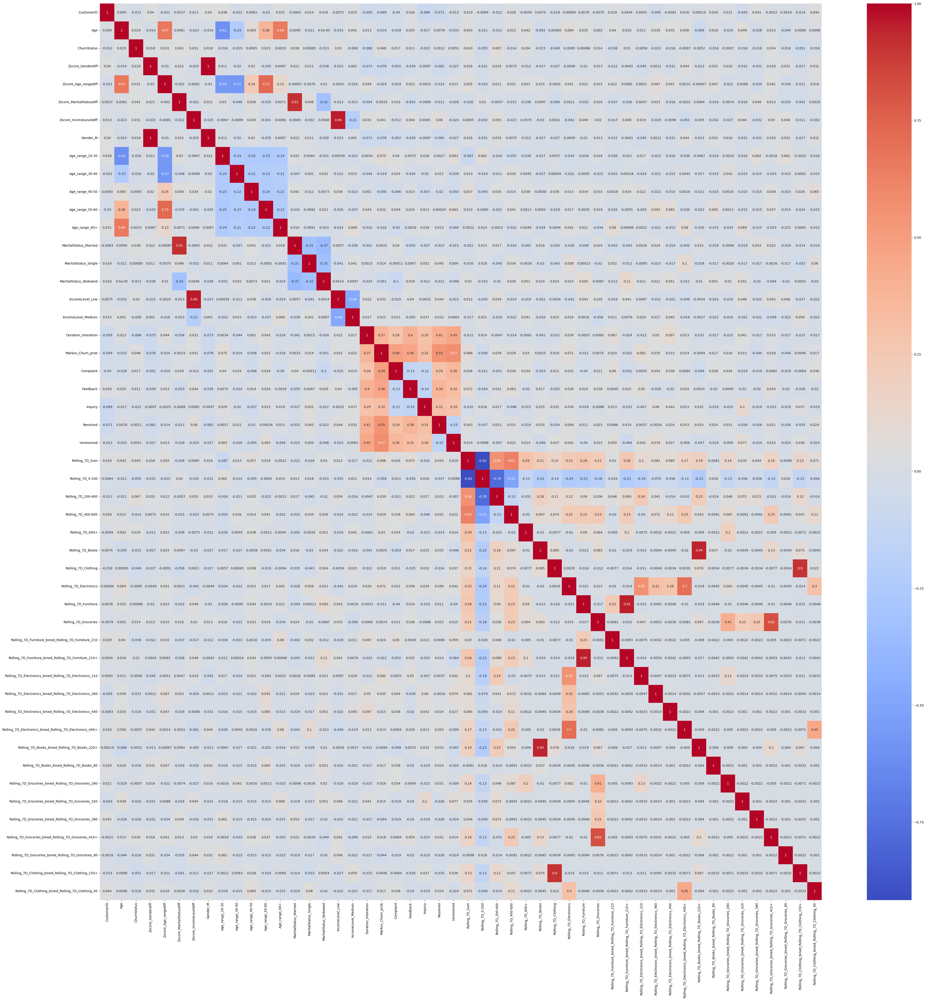

In [135]:
corr_df = enhanced_Interaction_Customer_Transactions.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')

## Online Activity Sheet

In [137]:
Online_Activity = data['Online_Activity']

In [138]:
Online_Activity = Online_Activity.merge(data['Churn_Status'], how = "left", on = "CustomerID")

In [139]:
Online_Activity

,CustomerID,LastLoginDate,LoginFrequency,ServiceUsage,ChurnStatus
0,1,2023-10-21,34,Mobile App,0
1,2,2023-12-05,5,Website,1
2,3,2023-11-15,3,Website,0
3,4,2023-08-25,2,Website,0
4,5,2023-10-27,41,Website,0
...,...,...,...,...,...
995,996,2023-01-29,38,Mobile App,0
996,997,2023-04-01,5,Mobile App,0
997,998,2023-07-10,47,Website,0
998,999,2023-01-08,23,Website,0


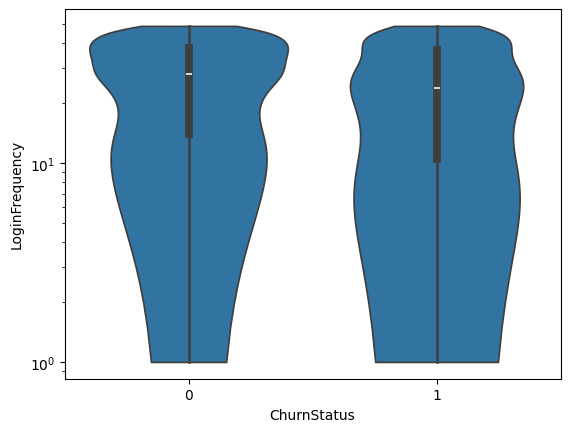

In [140]:
sns.violinplot(x="ChurnStatus" , y= "LoginFrequency"
               , data=Online_Activity, cut = 0)
plt.yscale("log")

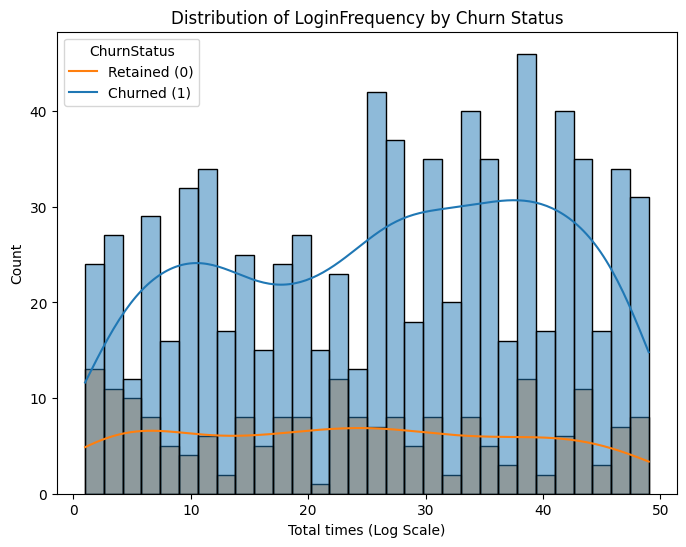

In [141]:
plt.figure(figsize=(8,6))

sns.histplot(data=Online_Activity, x="LoginFrequency", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, False), alpha=0.5)

plt.title("Distribution of LoginFrequency by Churn Status")
plt.xlabel("Total times (Log Scale)")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  
plt.show()


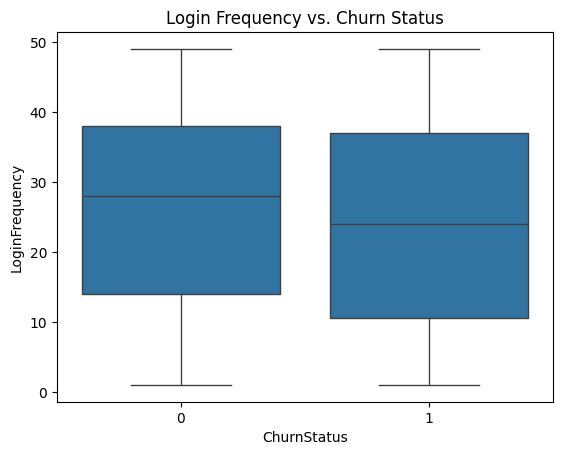

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.boxplot(x="ChurnStatus", y="LoginFrequency", data=Online_Activity)
plt.title("Login Frequency vs. Churn Status")
plt.show()


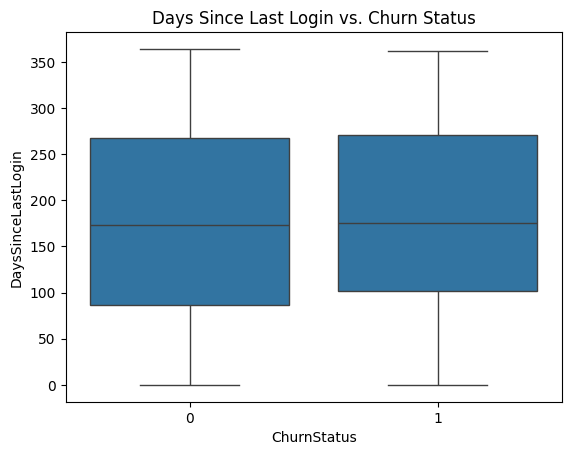

In [143]:
from datetime import datetime

Online_Activity["DaysSinceLastLogin"] = (Online_Activity["LastLoginDate"].max() - pd.to_datetime(Online_Activity["LastLoginDate"])).dt.days

sns.boxplot(x="ChurnStatus", y="DaysSinceLastLogin", data=Online_Activity)
plt.title("Days Since Last Login vs. Churn Status")
plt.show()


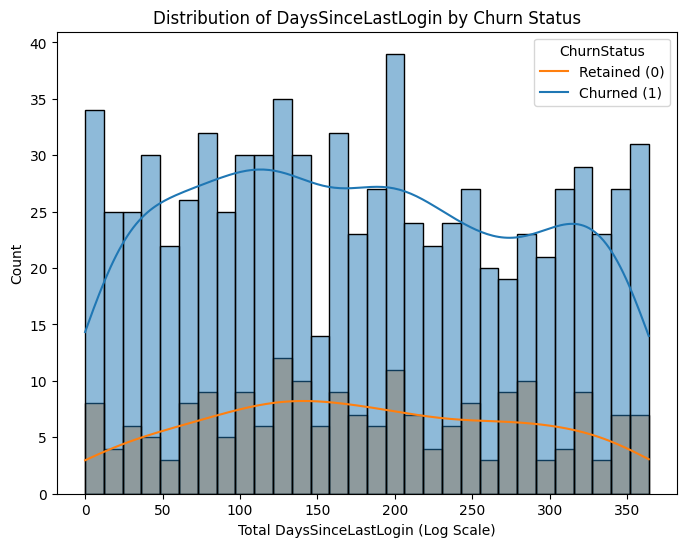

In [144]:
plt.figure(figsize=(8,6))

sns.histplot(data=Online_Activity, x="DaysSinceLastLogin", hue="ChurnStatus",
             bins=30, kde=True, log_scale=(False, False), alpha=0.5)

plt.title("Distribution of DaysSinceLastLogin by Churn Status")
plt.xlabel("Total DaysSinceLastLogin (Log Scale)")
plt.ylabel("Count")
plt.legend(title="ChurnStatus", labels=["Retained (0)", "Churned (1)"])  
plt.show()


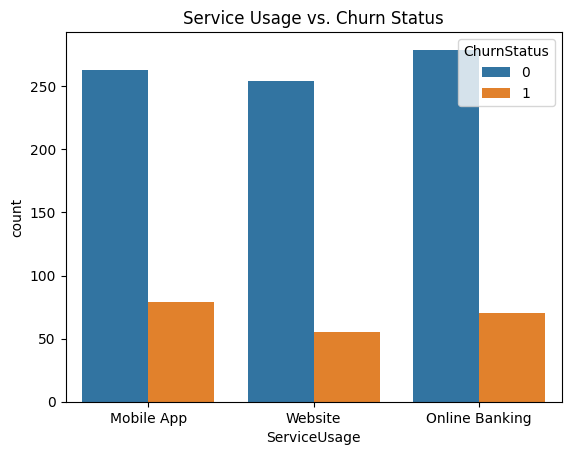

In [145]:
sns.countplot(x="ServiceUsage", hue="ChurnStatus", data=Online_Activity)
plt.title("Service Usage vs. Churn Status")
plt.show()


In [146]:
import scipy.stats as stats

t_stat, p_value = stats.ttest_ind(
    Online_Activity.loc[Online_Activity["ChurnStatus"] == 1, "LoginFrequency"],
    Online_Activity.loc[Online_Activity["ChurnStatus"] == 0, "LoginFrequency"]
)
print(f"T-test for LoginFrequency: p-value = {p_value:.4f}")


T-test for LoginFrequency: p-value = 0.0098


In [104]:
import scipy.stats as stats


t_stat, p_value = stats.ttest_ind(
    Online_Activity.loc[Online_Activity["ChurnStatus"] == 1, "DaysSinceLastLogin"],
    Online_Activity.loc[Online_Activity["ChurnStatus"] == 0, "DaysSinceLastLogin"]
)
print(f"T-test for DaysSinceLastLogin_Normalized: p-value = {p_value:.4f}")

T-test for DaysSinceLastLogin_Normalized: p-value = 0.7749


In [105]:
import pandas as pd
import scipy.stats as stats

contingency_table = pd.crosstab(Online_Activity["ServiceUsage"], Online_Activity["ChurnStatus"])

# Kai^2 test
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)


print(f"Kai squared statistics: {chi2:.4f}")
print(f"P value: {p:.4f}")


alpha = 0.05
if p < alpha:
    print("ServiceUsage and ChurnStatus have obvious correlation")
else:
    print("ServiceUsage and ChurnStatus have no obvious correlation")


Kai squared statistics: 2.8469
P value: 0.2409
ServiceUsage and ChurnStatus have no obvious correlation


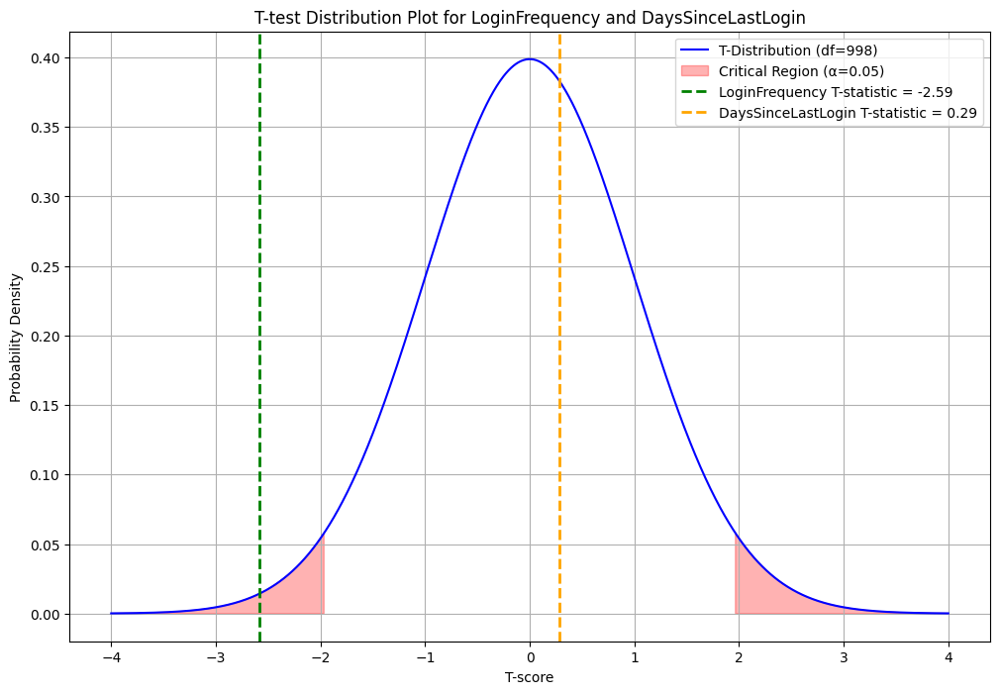

T-statistic: -2.5870, p-value: 0.0098


In [160]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt


churned = Online_Activity.loc[Online_Activity["ChurnStatus"] == 1, "LoginFrequency"]
retained = Online_Activity.loc[Online_Activity["ChurnStatus"] == 0, "LoginFrequency"]

churned1 = Online_Activity.loc[Online_Activity["ChurnStatus"] == 1, "DaysSinceLastLogin"]
retained1 = Online_Activity.loc[Online_Activity["ChurnStatus"] == 0, "DaysSinceLastLogin"]


n1 = len(churned)
n2 = len(retained)
df = n1 + n2 - 2  


x = np.linspace(-4, 4, 1000)
y = stats.t.pdf(x, df)  


t_stat, p_value = stats.ttest_ind(churned, retained)
t_stat1, p_value1 = stats.ttest_ind(churned1, retained1)


plt.figure(figsize=(12, 8))
plt.plot(x, y, label=f"T-Distribution (df={df})", color='blue')


alpha = 0.05
t_critical = stats.t.ppf(1 - alpha / 2, df)  
plt.fill_between(x, y, where=(x < -t_critical) | (x > t_critical), color='red', alpha=0.3, label="Critical Region (α=0.05)")


plt.axvline(t_stat, color='green', linestyle='dashed', linewidth=2, label=f"LoginFrequency T-statistic = {t_stat:.2f}")
plt.axvline(t_stat1, color='orange', linestyle='dashed', linewidth=2, label=f"DaysSinceLastLogin T-statistic = {t_stat1:.2f}")


plt.title("T-test Distribution Plot for LoginFrequency and DaysSinceLastLogin")
plt.xlabel("T-score")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()
plt.savefig("Plots/T_test_Distribution.png", dpi=300, bbox_inches='tight')

plt.show()

print(f"T-statistic: {t_stat:.4f}, p-value: {p_value:.4f}")


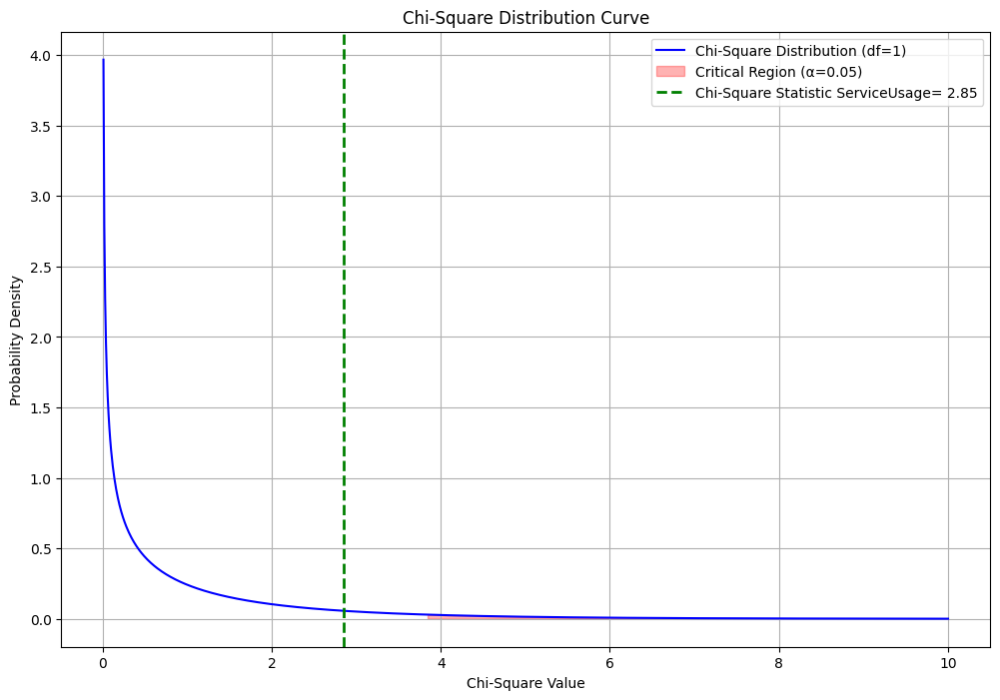

In [159]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt


df = 1  


x = np.linspace(0, 10, 1000) 
y = stats.chi2.pdf(x, df)  


contingency_table = pd.crosstab(Online_Activity["ServiceUsage"], Online_Activity["ChurnStatus"])


chi2_stat, p, dof, expected = stats.chi2_contingency(contingency_table)



plt.figure(figsize=(12, 8))
plt.plot(x, y, label=f"Chi-Square Distribution (df={df})", color='blue')


alpha = 0.05
chi2_critical = stats.chi2.ppf(1 - alpha, df)  
plt.fill_between(x, y, where=(x > chi2_critical), color='red', alpha=0.3, label="Critical Region (α=0.05)")


plt.axvline(chi2_stat, color='green', linestyle='dashed', linewidth=2, label=f"Chi-Square Statistic ServiceUsage= {chi2_stat:.2f}")


plt.title("Chi-Square Distribution Curve")
plt.xlabel("Chi-Square Value")
plt.ylabel("Probability Density")
plt.legend()
plt.grid()
plt.savefig("Plots/Chi-Square_ServiceUsage.png", dpi=300, bbox_inches='tight')

plt.show()


In [170]:
from scipy.stats import spearmanr
corr, p_value = spearmanr(enhanced_Interaction_Customer_Transaction_Login["Age"], enhanced_Interaction_Customer_Transaction_Login["Zscore_Age_rangediff"])
print(f"Spearman Correlation: {corr:.4f}, p-value: {p_value:.4f}")


Spearman Correlation: 0.6096, p-value: 0.0000


In [162]:

Online_Activity["LoginFrequency_Ratio"] = Online_Activity["LoginFrequency"] / Online_Activity["LoginFrequency"].max()

Online_Activity = pd.get_dummies(Online_Activity,columns=["ServiceUsage"], drop_first = True)


In [164]:
Online_Activity = Online_Activity.drop(columns=["LastLoginDate"])

In [165]:
Online_Activity["LoginCategory"] = pd.cut(Online_Activity["LoginFrequency"], bins=[0, 15, 25, 45, np.inf], labels=["Low", "Medium", "High", "VeryHigh"])

In [166]:
Online_Activity = pd.get_dummies(Online_Activity, columns=["LoginCategory"], drop_first=True)

In [167]:
enhanced_Interaction_Customer_Transaction_Login =  enhanced_Interaction_Customer_Transactions.merge(Online_Activity.drop(columns=["ChurnStatus"]), how = "left", on = "CustomerID").T.drop_duplicates().T

In [172]:
for col in enhanced_Interaction_Customer_Transaction_Login.columns:
    try:
        enhanced_Interaction_Customer_Transaction_Login[col] = pd.to_numeric(enhanced_Interaction_Customer_Transaction_Login[col] , errors='ignore')  # 'ignore' 让非数值列保持不变
    except:
        print(f"failed at {col}")

/var/folders/pt/0nf2m3pj1f3b373wsyfc6glh0000gn/T/ipykernel_52421/2591289443.py:3: FutureWarning:

errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead



In [173]:
enhanced_Interaction_Customer_Transaction_Login["Duration_Interation"] = enhanced_Interaction_Customer_Transaction_Login["Duration_Interation"].dt.days.astype(float)

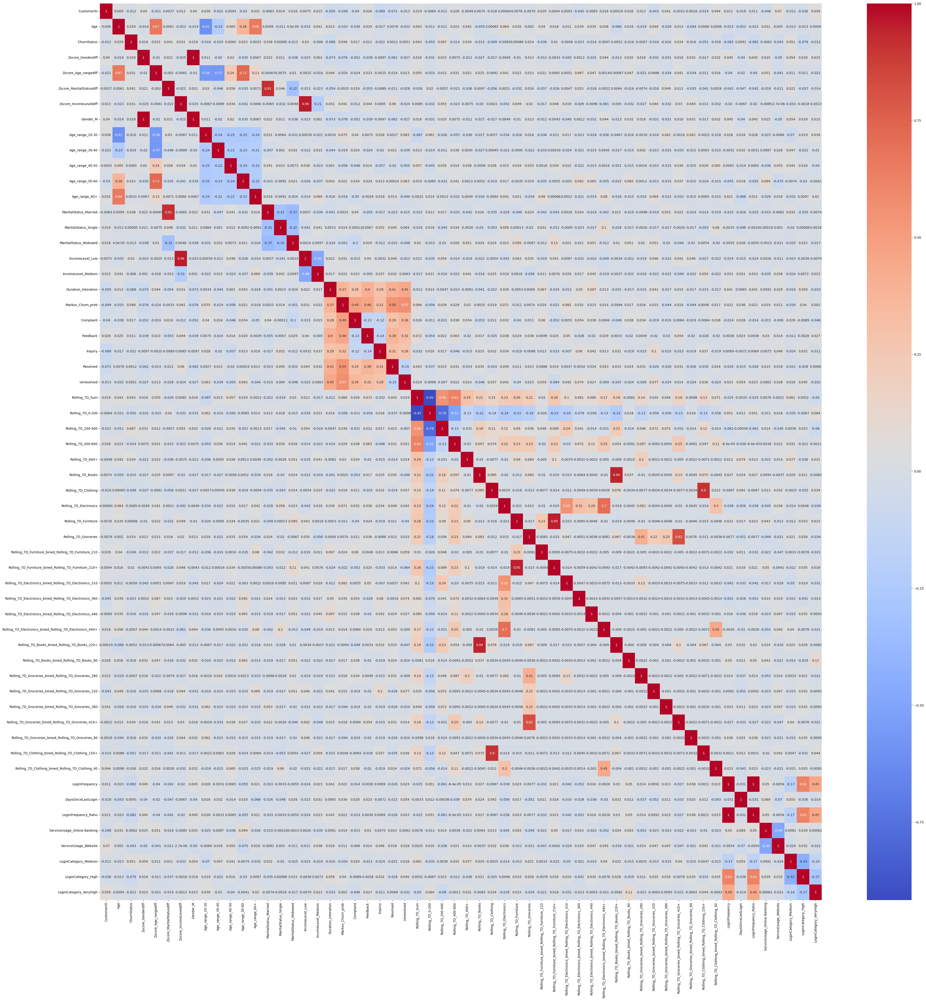

In [176]:
corr = enhanced_Interaction_Customer_Transaction_Login.corr()

plt.figure(figsize=(50, 50))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [177]:
enhanced_Interaction_Customer_Transaction_Login.to_csv("enhanced_customer_data.csv", index=False)